In [2]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("No GPU detected")

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [4]:
!pip install -q -U transformers
!pip install -q -U pillow


In [9]:
import transformers
from PIL import Image

print("Transformers:", transformers.__version__)
print("Pillow: OK")

Transformers: 5.17.0
Pillow: OK


In [11]:
!pip install -q -U accelerate


In [13]:
from transformers import ColPaliForRetrieval, ColPaliProcessor

print("ColPali classes imported successfully")

ImportError: cannot import name '_Ink' from 'PIL._typing' (/usr/local/lib/python3.13/dist-packages/PIL/_typing.py)

In [1]:
!pip install -q --upgrade --force-reinstall "pillow>=10.4,<12"

In [3]:
from PIL import Image
import PIL

print("Pillow:", PIL.__version__)

Pillow: 11.3.0


In [5]:
from transformers import ColPaliForRetrieval, ColPaliProcessor

print("ColPali classes imported successfully")

ColPali classes imported successfully


In [6]:
import torch
from transformers import ColPaliForRetrieval, ColPaliProcessor

model_name = "vidore/colpali-v1.3-hf"

processor = ColPaliProcessor.from_pretrained(model_name)

model = ColPaliForRetrieval.from_pretrained(
    model_name,
    torch_dtype=torch.float16,
    device_map="auto"
)

print("ColPali model loaded successfully!")

preprocessor_config.json:   0%|          | 0.00/423 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/243k [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 34.6MB            

tokenizer.json: downloading bytes:           |  0.00B            

special_tokens_map.json:   0%|          | 0.00/733 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/65.1k [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/605 [00:00<?, ?it/s]

ColPali model loaded successfully!


In [8]:
!pip install -q pymupdf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 75.3 MB/s eta 0:00:00


In [9]:
import fitz

print("PyMuPDF imported successfully!")

PyMuPDF imported successfully!


Page image size: (1224, 1584)


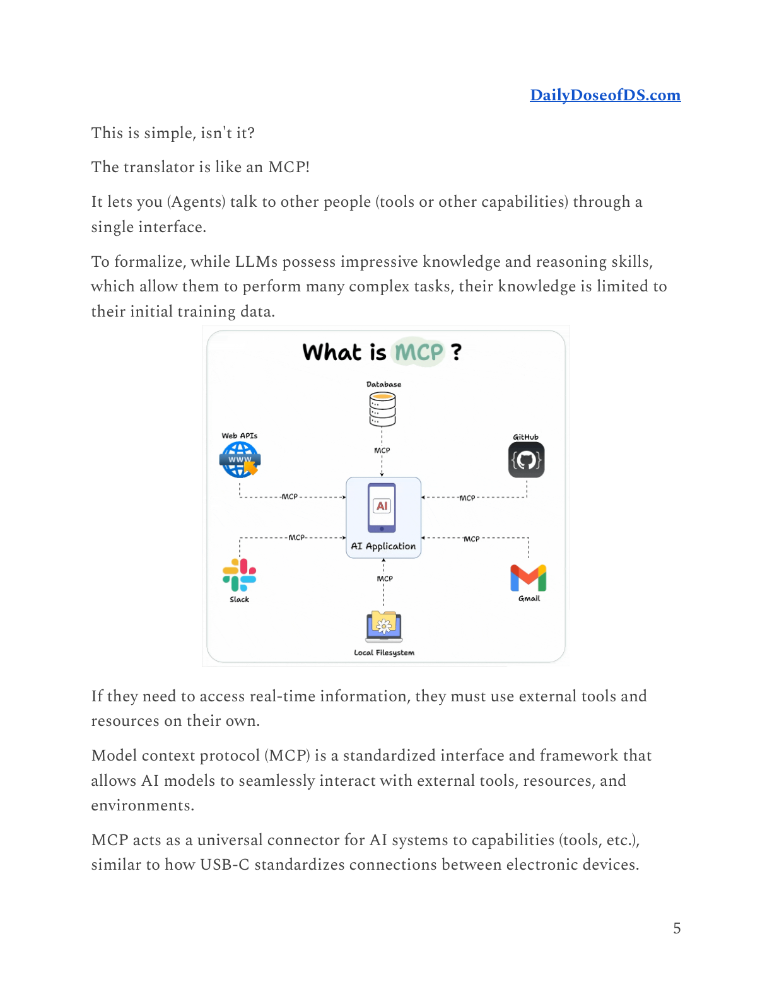

In [10]:
from PIL import Image
import fitz

pdf = fitz.open("mcp.pdf")

page = pdf[5]  # Page 6

pix = page.get_pixmap(matrix=fitz.Matrix(2, 2))

image = Image.frombytes(
    "RGB",
    [pix.width, pix.height],
    pix.samples
)

print("Page image size:", image.size)

image

In [12]:
batch = processor(
    images=[image],
    return_tensors="pt"
).to(model.device)

with torch.no_grad():
    outputs = model(**batch)

image_embeddings = outputs.embeddings

print("Embedding shape:", image_embeddings.shape)

Embedding shape: torch.Size([1, 1030, 128])


In [13]:
query = "Explain the MCP architecture"

query_batch = processor(
    text=query,
    return_tensors="pt"
).to(model.device)

with torch.no_grad():
    query_outputs = model(**query_batch)

query_embeddings = query_outputs.embeddings

print("Query embedding shape:", query_embeddings.shape)

Query embedding shape: torch.Size([28, 15, 128])


In [14]:
with torch.no_grad():
    score = processor.score_retrieval(
        query_embeddings,
        image_embeddings
    )

print("Retrieval score:", score)

Retrieval score: tensor([[ 8.6094],
        [11.4922],
        [10.7266],
        [11.0547],
        [11.7031],
        [11.2109],
        [10.0000],
        [12.5781],
        [11.5625],
        [10.3047],
        [10.1406],
        [12.5781],
        [ 8.4844],
        [ 8.6172],
        [ 9.2969],
        [12.5781],
        [11.7031],
        [10.5781],
        [10.2969],
        [10.3047],
        [11.2109],
        [11.5625],
        [10.1406],
        [10.2969],
        [11.5625],
        [11.9062],
        [10.5781],
        [10.1406]], dtype=torch.float16)


In [15]:
print("Query:", query_embeddings.shape)
print("Image:", image_embeddings.shape)

Query: torch.Size([28, 15, 128])
Image: torch.Size([1, 1030, 128])


In [16]:
# Encode the query
query_inputs = processor.process_queries(
    [query]
).to(model.device)

# Encode the page image
image_inputs = processor.process_images(
    [image]
).to(model.device)

with torch.no_grad():
    query_embeddings = model(**query_inputs).embeddings
    image_embeddings = model(**image_inputs).embeddings

print("Query:", query_embeddings.shape)
print("Image:", image_embeddings.shape)

Query: torch.Size([1, 18, 128])
Image: torch.Size([1, 1030, 128])


In [18]:
scores = processor.score_retrieval(
    query_embeddings,
    image_embeddings
)

print("Scores:", scores)
print("Score shape:", scores.shape)


Scores: tensor([[14.6953]], dtype=torch.float16)
Score shape: torch.Size([1, 1])


In [19]:
import fitz
from PIL import Image
from pathlib import Path

pdf = fitz.open("mcp.pdf")

rendered_dir = Path("rendered_pages")
rendered_dir.mkdir(exist_ok=True)

for i, page in enumerate(pdf):
    pix = page.get_pixmap(matrix=fitz.Matrix(2, 2))

    img = Image.frombytes(
        "RGB",
        [pix.width, pix.height],
        pix.samples
    )

    img.save(rendered_dir / f"page_{i+1:03d}.png")

print(f"Rendered {len(pdf)} pages")

Rendered 74 pages


In [20]:
pages = []

for i in range(1, 75):
    path = f"rendered_pages/page_{i:03d}.png"
    img = Image.open(path).convert("RGB")
    pages.append(img)

print("Pages loaded:", len(pages))

Pages loaded: 74


In [21]:
image_embeddings_list = []

batch_size = 4

for start in range(0, len(pages), batch_size):
    batch_images = pages[start:start + batch_size]

    image_inputs = processor.process_images(
        batch_images
    ).to(model.device)

    with torch.no_grad():
        batch_embeddings = model(**image_inputs).embeddings

    image_embeddings_list.append(batch_embeddings)

    print(
        f"Processed pages "
        f"{start + 1}-{min(start + batch_size, len(pages))}"
    )

Processed pages 1-4
Processed pages 5-8
Processed pages 9-12
Processed pages 13-16
Processed pages 17-20
Processed pages 21-24
Processed pages 25-28
Processed pages 29-32
Processed pages 33-36
Processed pages 37-40
Processed pages 41-44
Processed pages 45-48
Processed pages 49-52
Processed pages 53-56
Processed pages 57-60
Processed pages 61-64
Processed pages 65-68
Processed pages 69-72
Processed pages 73-74


In [22]:
all_image_embeddings = torch.cat(
    image_embeddings_list,
    dim=0
)

print("All image embeddings:", all_image_embeddings.shape)

All image embeddings: torch.Size([74, 1030, 128])


In [23]:
query = "Explain the MCP architecture"

query_inputs = processor.process_queries(
    [query]
).to(model.device)

with torch.no_grad():
    query_embeddings = model(**query_inputs).embeddings

print("Query embeddings:", query_embeddings.shape)

Query embeddings: torch.Size([1, 18, 128])


In [24]:
scores = processor.score_retrieval(
    query_embeddings,
    all_image_embeddings
)

print("Scores shape:", scores.shape)

Scores shape: torch.Size([1, 74])


In [25]:
top_k = 5

top_scores, top_indices = torch.topk(
    scores[0],
    k=top_k
)

for rank, (score, index) in enumerate(
    zip(top_scores, top_indices),
    start=1
):
    print(
        f"Rank {rank}: "
        f"Page {index.item() + 1} "
        f"Score {score.item():.4f}"
    )

Rank 1: Page 10 Score 15.5391
Rank 2: Page 7 Score 15.1328
Rank 3: Page 9 Score 14.7812
Rank 4: Page 3 Score 14.7344
Rank 5: Page 6 Score 14.6953



===== Rank 1: Page 10 =====


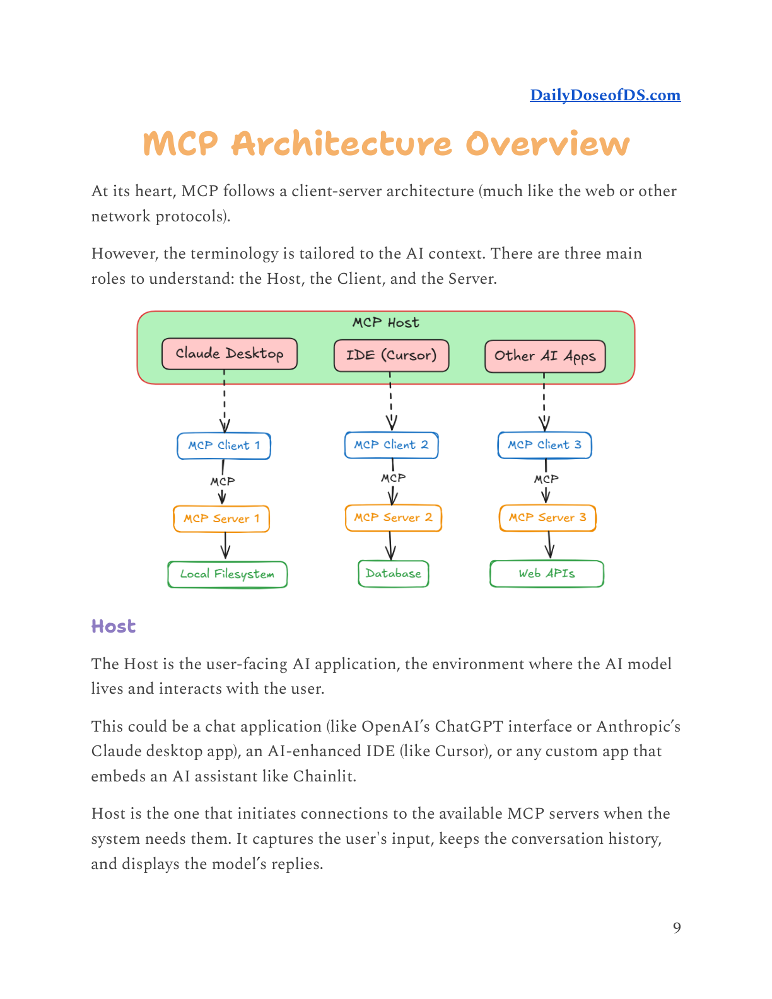


===== Rank 2: Page 7 =====


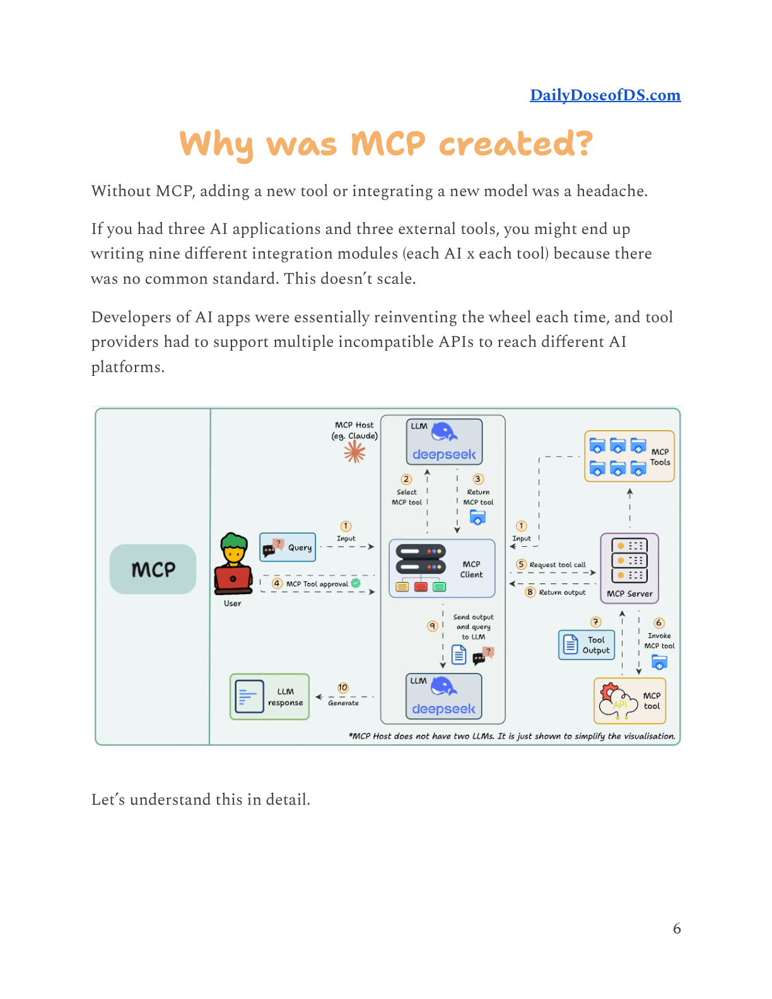


===== Rank 3: Page 9 =====


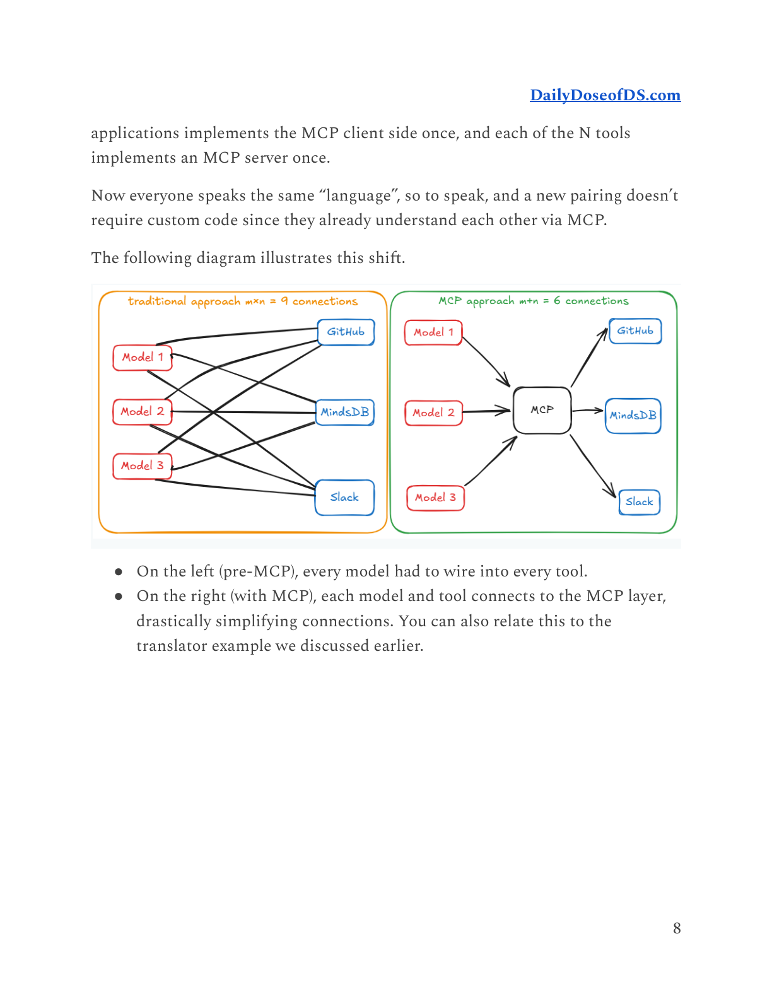


===== Rank 4: Page 3 =====


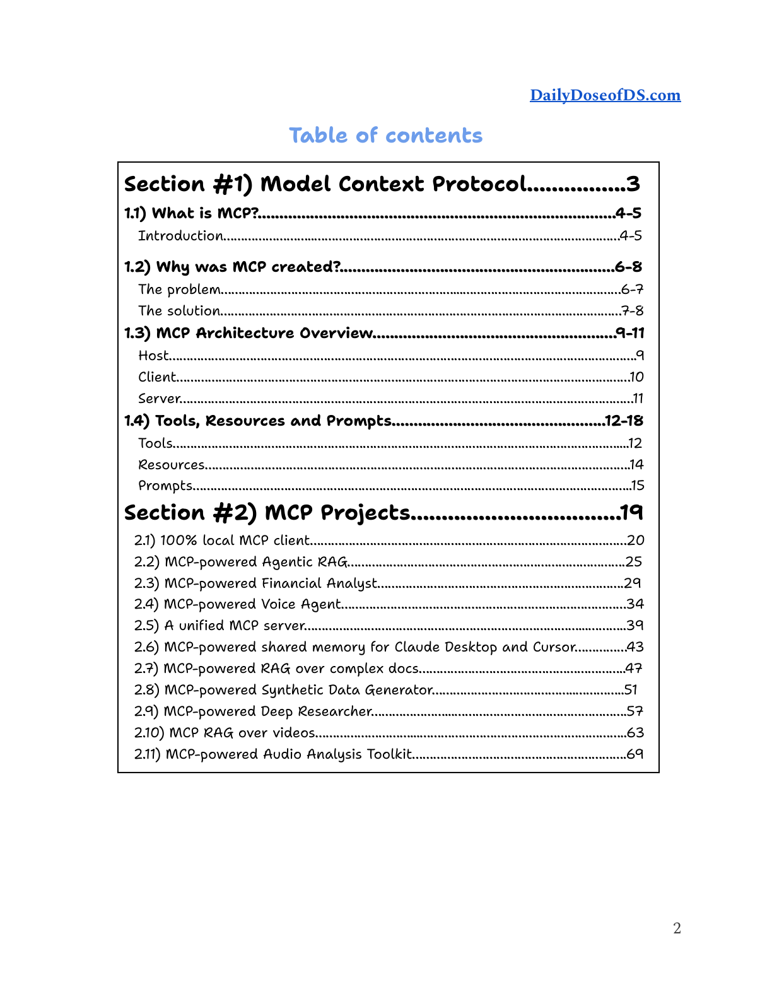


===== Rank 5: Page 6 =====


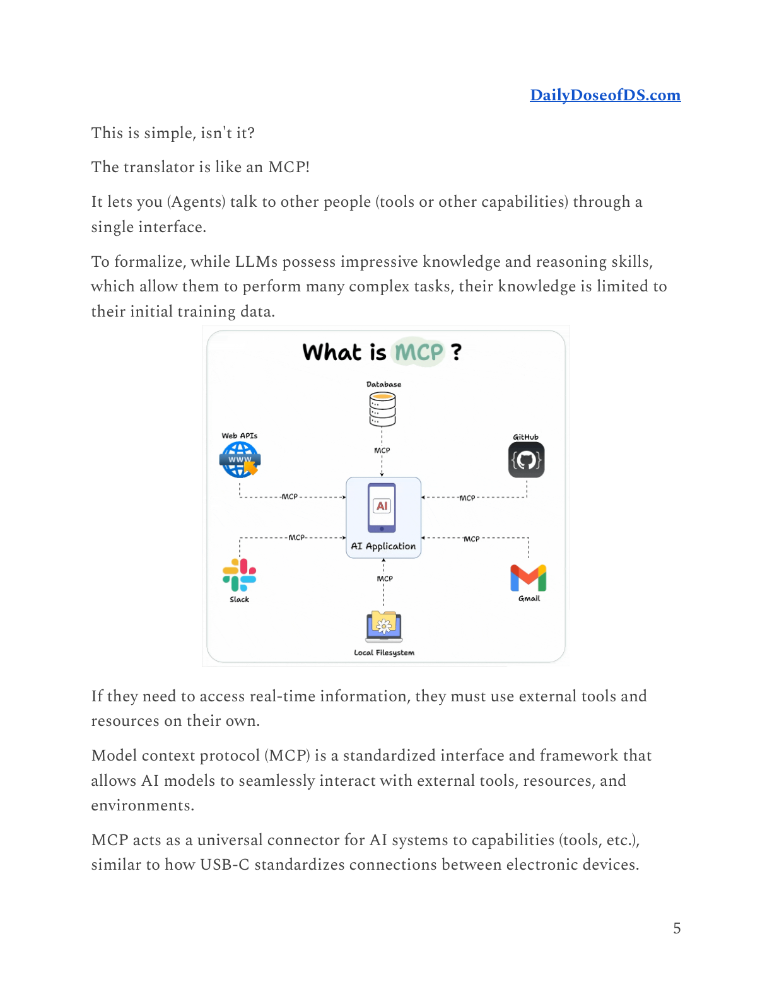

In [26]:
from IPython.display import display

for rank, index in enumerate(top_indices, start=1):
    page_number = index.item() + 1
    print(f"\n===== Rank {rank}: Page {page_number} =====")

    display(pages[page_number - 1])

Page 10


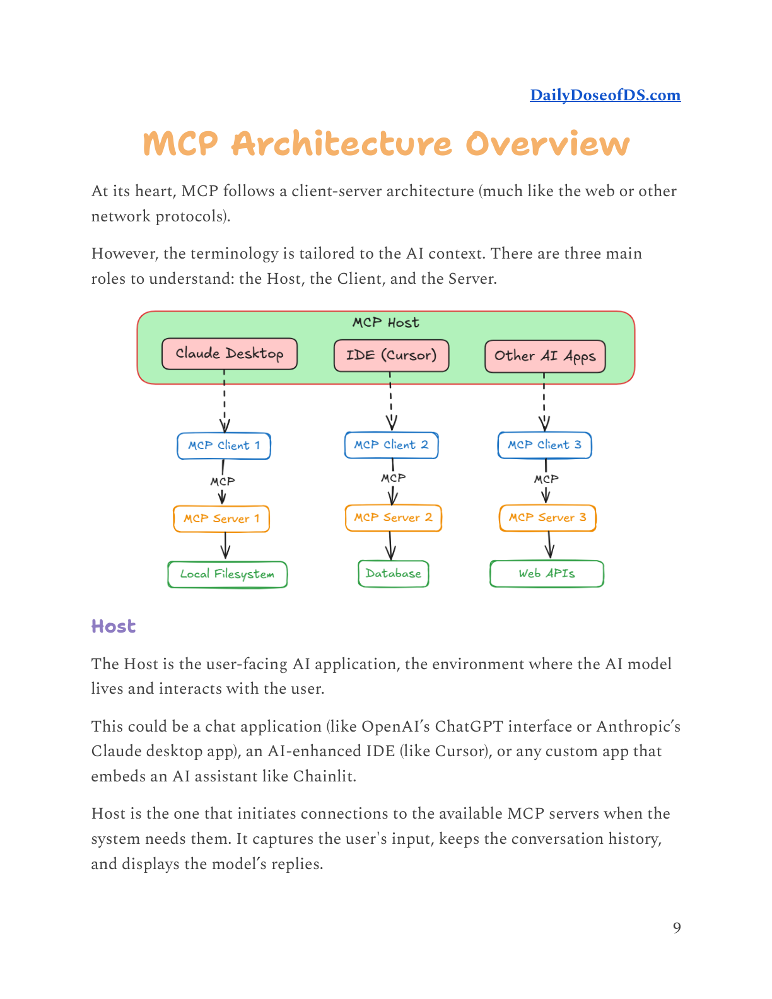

Page 6


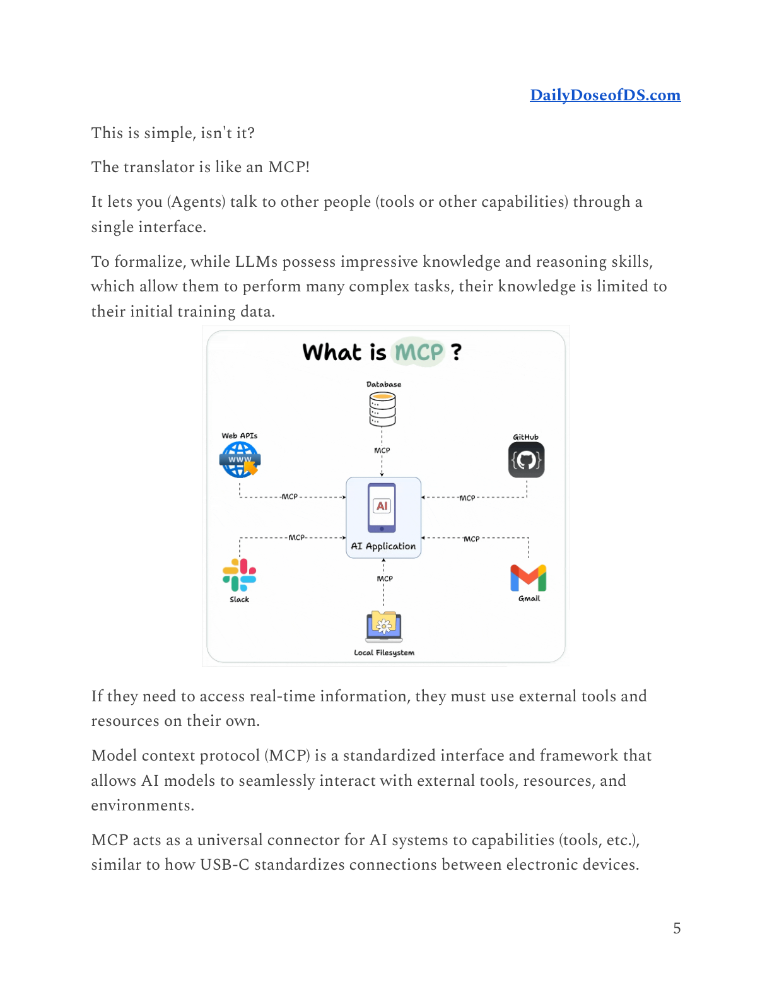

In [27]:
retrieved_pages = [10, 6]

for page_number in retrieved_pages:
    print(f"Page {page_number}")
    display(pages[page_number - 1])

In [28]:
!pip install -q -U "qwen-vl-utils"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 25.9 MB/s eta 0:00:00


In [29]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
import torch

vlm_name = "Qwen/Qwen2.5-VL-3B-Instruct"

vlm_processor = AutoProcessor.from_pretrained(vlm_name)

vlm = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    vlm_name,
    torch_dtype=torch.float16,
    device_map="auto"
)

print("VLM loaded successfully!")

preprocessor_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.37k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/65.4k [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/824 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/216 [00:00<?, ?B/s]

VLM loaded successfully!


In [30]:
from qwen_vl_utils import process_vision_info

question = """
Explain the MCP architecture shown in these pages.
Focus on:
1. The components
2. How the components communicate
3. The role of MCP Client and MCP Server
4. The relationships shown by arrows or diagrams
5. Any important visual information that normal text extraction might miss
"""

messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": pages[9],   # Page 10
            },
            {
                "type": "image",
                "image": pages[5],   # Page 6
            },
            {
                "type": "text",
                "text": question,
            },
        ],
    }
]

In [31]:
text = vlm_processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

image_inputs, video_inputs = process_vision_info(messages)

inputs = vlm_processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)

inputs = inputs.to(vlm.device)

In [33]:
with torch.no_grad():
    generated_ids = vlm.generate(
        **inputs,
        max_new_tokens=500
    )

generated_ids_trimmed = [
    out_ids[len(in_ids):]
    for in_ids, out_ids in zip(
        inputs.input_ids,
        generated_ids
    )
]

output_text = vlm_processor.batch_decode(
    generated_ids_trimmed,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False
)

print(output_text[0])

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.55 GiB. GPU 0 has a total capacity of 14.56 GiB of which 1.16 GiB is free. Including non-PyTorch memory, this process has 13.40 GiB memory in use. Of the allocated memory 13.09 GiB is allocated by PyTorch, and 179.28 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://docs.pytorch.org/docs/stable/notes/cuda.html#optimizing-memory-usage-with-pytorch-cuda-alloc-conf)

In [34]:
del image_embeddings_list
del all_image_embeddings
del query_embeddings
del image_embeddings
del query_inputs
del image_inputs

del model
del processor

import gc
gc.collect()

torch.cuda.empty_cache()

print(
    f"Free GPU memory: "
    f"{torch.cuda.mem_get_info()[0] / 1024**3:.2f} GB"
)

Free GPU memory: 1.56 GB


In [36]:
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": pages[5],
            },
            {
                "type": "text",
                "text": """
Explain the MCP architecture shown in this page.

Focus on:
1. The main components
2. How they communicate
3. The role of MCP Client and MCP Server
4. Relationships shown by arrows or diagrams
5. Visual information that may not be captured by normal text extraction
""",
            },
        ],
    }
]

In [37]:
from qwen_vl_utils import process_vision_info

text = vlm_processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

image_inputs, video_inputs = process_vision_info(messages)

inputs = vlm_processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)

inputs = inputs.to(vlm.device)

In [38]:
with torch.no_grad():
    generated_ids = vlm.generate(
        **inputs,
        max_new_tokens=200
    )

generated_ids_trimmed = [
    out_ids[len(in_ids):]
    for in_ids, out_ids in zip(
        inputs.input_ids,
        generated_ids
    )
]

output_text = vlm_processor.batch_decode(
    generated_ids_trimmed,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False
)

print(output_text[0])

### MCP Architecture

#### 1. Main Components
- **AI Application**: The central component where AI models run.
- **MCP (Model Context Protocol)**: A standardized interface and framework for communication between AI models and external tools, resources, and environments.
- **Web APIs**: External services accessed via web protocols.
- **Database**: Stores data relevant to the AI application.
- **GitHub**: A platform for version control and collaboration.
- **Slack**: A messaging platform for team communication.
- **Local Filesystem**: Local storage for files and data.
- **Gmail**: An email service for communication.

#### 2. How They Communicate
The AI application communicates with various external services through the MCP protocol. This includes accessing databases, interacting with GitHub, Slack, Gmail, and local filesystems. The MCP acts as a bridge, enabling seamless interaction between the AI model and these external resources.

#### 3. Role of MCP Client and MCP Server
- **MCP


In [39]:
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": pages[5],
            },
            {
                "type": "text",
                "text": """
Analyze this document page for a RAG system.

Return:
1. Main topic
2. Important text
3. Components/entities shown
4. Relationships between components
5. What the arrows, boxes, tables, or diagrams mean
6. A concise summary

Do not invent information that is not visible on the page.
""",
            },
        ],
    }
]

In [40]:
text = vlm_processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

image_inputs, video_inputs = process_vision_info(messages)

inputs = vlm_processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
).to(vlm.device)

with torch.no_grad():
    generated_ids = vlm.generate(
        **inputs,
        max_new_tokens=250
    )

generated_ids_trimmed = [
    out_ids[len(in_ids):]
    for in_ids, out_ids in zip(
        inputs.input_ids,
        generated_ids
    )
]

visual_context = vlm_processor.batch_decode(
    generated_ids_trimmed,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False
)[0]

print(visual_context)

1. **Main topic**: Model Context Protocol (MCP)

2. **Important text**:
   - "The translator is like an MCP!"
   - "It lets you (Agents) talk to other people (tools or other capabilities) through a single interface."
   - "To formalize, while LLMs possess impressive knowledge and reasoning skills, which allow them to perform many complex tasks, their knowledge is limited to their initial training data."
   - "Model context protocol (MCP) is a standardized interface and framework that allows AI models to seamlessly interact with external tools, resources, and environments."

3. **Components/entities shown**:
   - AI Application
   - Database
   - Web APIs (e.g., www)
   - GitHub
   - Gmail
   - Slack
   - Local Filesystem

4. **Relationships between components**:
   - The AI Application interacts with various entities through the MCP.
   - The MCP connects the AI Application to different databases, web APIs, GitHub, Gmail, Slack, and local filesystem.

5. **What the arrows, boxes, table

In [41]:
def retrieve_pages(query, image_embeddings, pages, processor, model, top_k=5):
    query_inputs = processor.process_queries(
        [query]
    ).to(model.device)

    with torch.no_grad():
        query_embeddings = model(**query_inputs).embeddings

    scores = processor.score_retrieval(
        query_embeddings,
        image_embeddings
    )[0]

    top_scores, top_indices = torch.topk(
        scores,
        k=top_k
    )

    results = []

    for score, index in zip(top_scores, top_indices):
        page_number = index.item() + 1

        results.append({
            "page": page_number,
            "score": score.item(),
            "image": pages[page_number - 1]
        })

    return results

In [42]:
query = "Explain the MCP architecture"

results = retrieve_pages(
    query,
    all_image_embeddings,
    pages,
    processor,
    model,
    top_k=5
)

for result in results:
    print(
        f"Page {result['page']} "
        f"| Score: {result['score']:.4f}"
    )

NameError: name 'all_image_embeddings' is not defined

In [44]:
print(type(model))
print(len(pages))

NameError: name 'model' is not defined

In [47]:
from transformers import ColPaliForRetrieval, ColPaliProcessor
import torch

model_name = "vidore/colpali-v1.3-hf"

processor = ColPaliProcessor.from_pretrained(model_name)

model = ColPaliForRetrieval.from_pretrained(
    model_name,
    torch_dtype=torch.float16,
    device_map="auto"
)

print("ColPali loaded successfully!")

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/605 [00:00<?, ?it/s]

ColPali loaded successfully!


In [48]:
free, total = torch.cuda.mem_get_info()

print(f"GPU free: {free / 1024**3:.2f} GB")

GPU free: 8.88 GB


In [49]:
image_embeddings_list = []

batch_size = 4

for start in range(0, len(pages), batch_size):
    batch_images = pages[start:start + batch_size]

    image_inputs = processor.process_images(
        batch_images
    ).to(model.device)

    with torch.no_grad():
        batch_embeddings = model(**image_inputs).embeddings

    # Move embeddings off the GPU
    image_embeddings_list.append(
        batch_embeddings.cpu()
    )

    # Free temporary GPU tensors
    del image_inputs
    del batch_embeddings
    torch.cuda.empty_cache()

    print(
        f"Processed pages "
        f"{start + 1}-{min(start + batch_size, len(pages))}"
    )

print("Finished encoding all pages.")

Processed pages 1-4
Processed pages 5-8
Processed pages 9-12
Processed pages 13-16
Processed pages 17-20
Processed pages 21-24
Processed pages 25-28
Processed pages 29-32
Processed pages 33-36
Processed pages 37-40
Processed pages 41-44
Processed pages 45-48
Processed pages 49-52
Processed pages 53-56
Processed pages 57-60
Processed pages 61-64
Processed pages 65-68
Processed pages 69-72
Processed pages 73-74
Finished encoding all pages.


In [50]:
all_image_embeddings = torch.cat(
    image_embeddings_list,
    dim=0
)

print("All image embeddings:", all_image_embeddings.shape)
print("Embedding device:", all_image_embeddings.device)

All image embeddings: torch.Size([74, 1030, 128])
Embedding device: cpu


In [52]:
def retrieve_pages(
    query,
    image_embeddings,
    pages,
    processor,
    model,
    top_k=5
):
    query_inputs = processor.process_queries(
        [query]
    ).to(model.device)

    with torch.no_grad():
        query_embeddings = model(**query_inputs).embeddings

    scores = processor.score_retrieval(
        query_embeddings,
        image_embeddings.to(model.device)
    )[0]

    top_scores, top_indices = torch.topk(
        scores,
        k=top_k
    )

    results = []

    for score, index in zip(top_scores, top_indices):
        page_number = index.item() + 1

        results.append({
            "page": page_number,
            "score": score.item(),
            "image": pages[page_number - 1]
        })

    return results

In [53]:
queries = [
    "Explain the MCP architecture",
    "What are MCP tools?",
    "How does MCP connect AI applications to external systems?"
]

for q in queries:
    print(f"\nQUERY: {q}")

    results = retrieve_pages(
        q,
        all_image_embeddings,
        pages,
        processor,
        model,
        top_k=3
    )

    for r in results:
        print(
            f"Page {r['page']} | "
            f"Score: {r['score']:.4f}"
        )


QUERY: Explain the MCP architecture
Page 10 | Score: 15.5391
Page 7 | Score: 15.1328
Page 9 | Score: 14.7812

QUERY: What are MCP tools?
Page 14 | Score: 15.8750
Page 13 | Score: 15.7266
Page 27 | Score: 15.7031

QUERY: How does MCP connect AI applications to external systems?
Page 8 | Score: 19.3594
Page 6 | Score: 19.2812
Page 7 | Score: 18.4375


In [54]:
from IPython.display import display

def show_results(results):
    for rank, result in enumerate(results, start=1):
        print(
            f"\n===== Rank {rank}: "
            f"Page {result['page']} | "
            f"Score {result['score']:.4f} ====="
        )
        display(result["image"])



########################################
QUERY: Explain the MCP architecture
########################################

===== Rank 1: Page 10 | Score 15.5391 =====


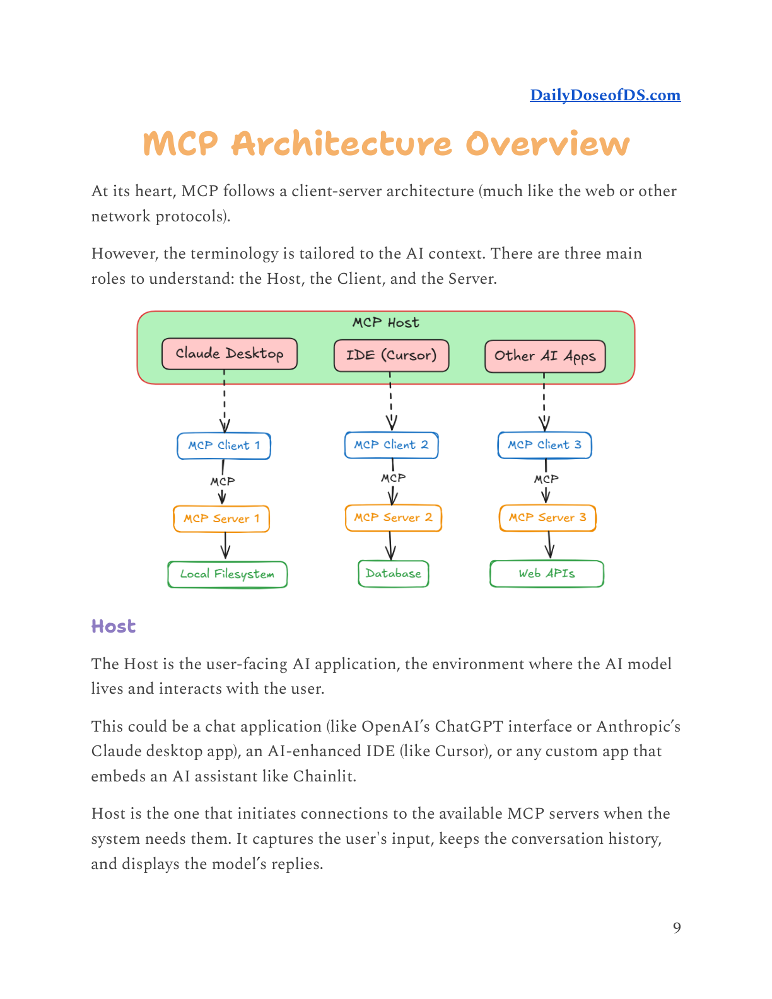


===== Rank 2: Page 7 | Score 15.1328 =====


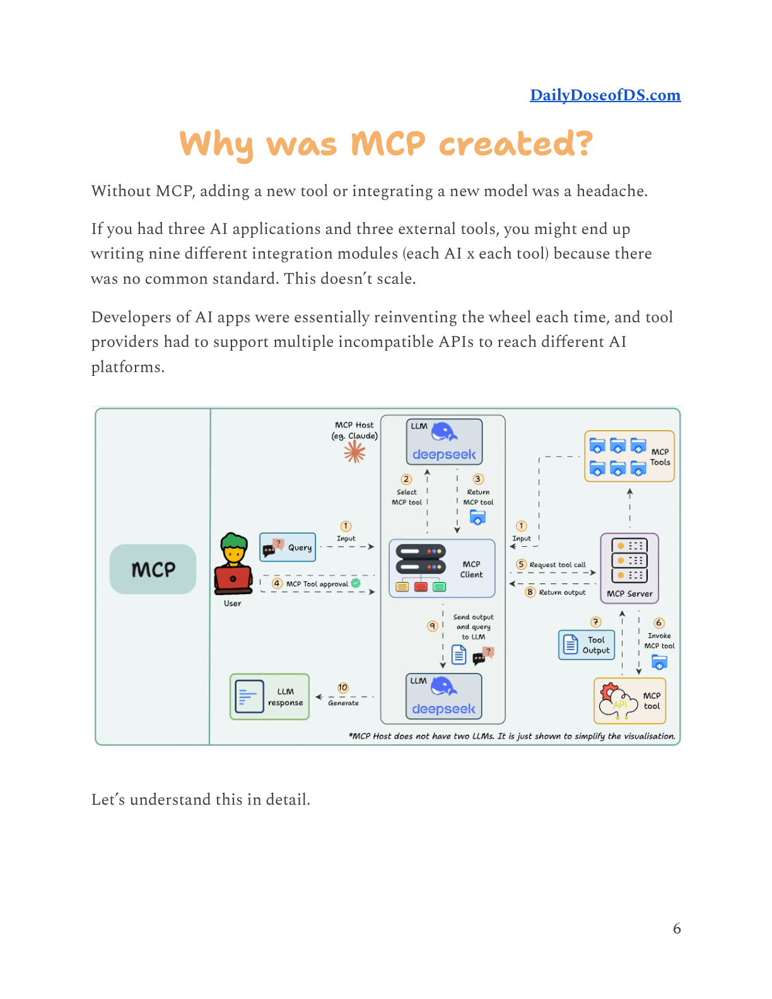


===== Rank 3: Page 9 | Score 14.7812 =====


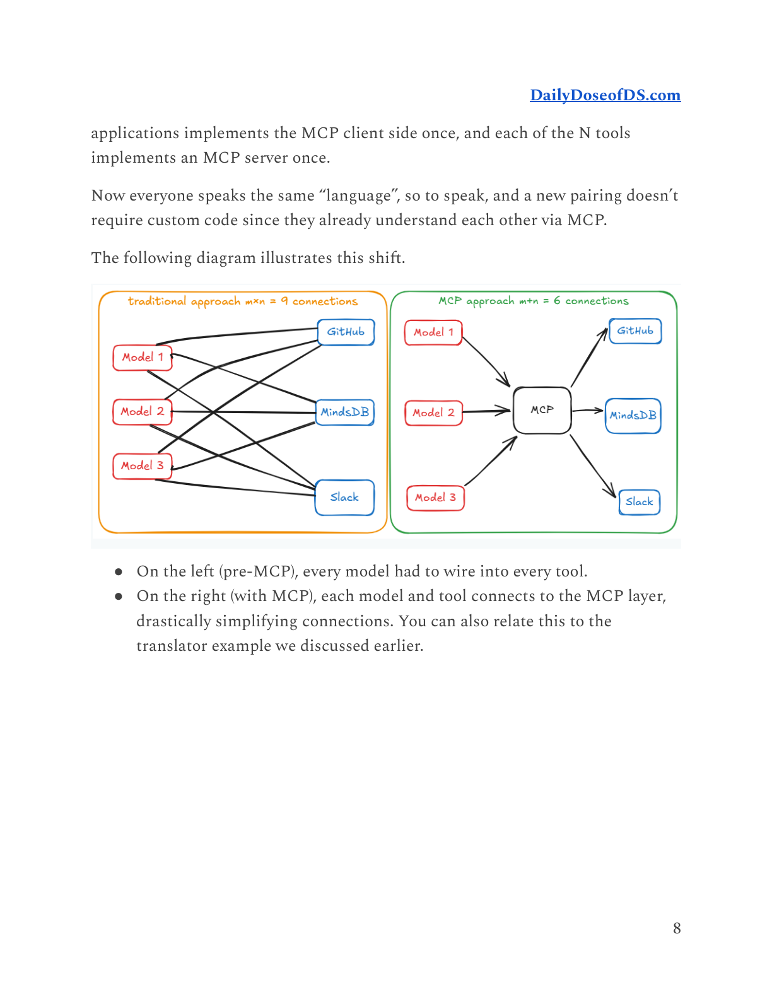



########################################
QUERY: What are MCP tools?
########################################

===== Rank 1: Page 14 | Score 15.8750 =====


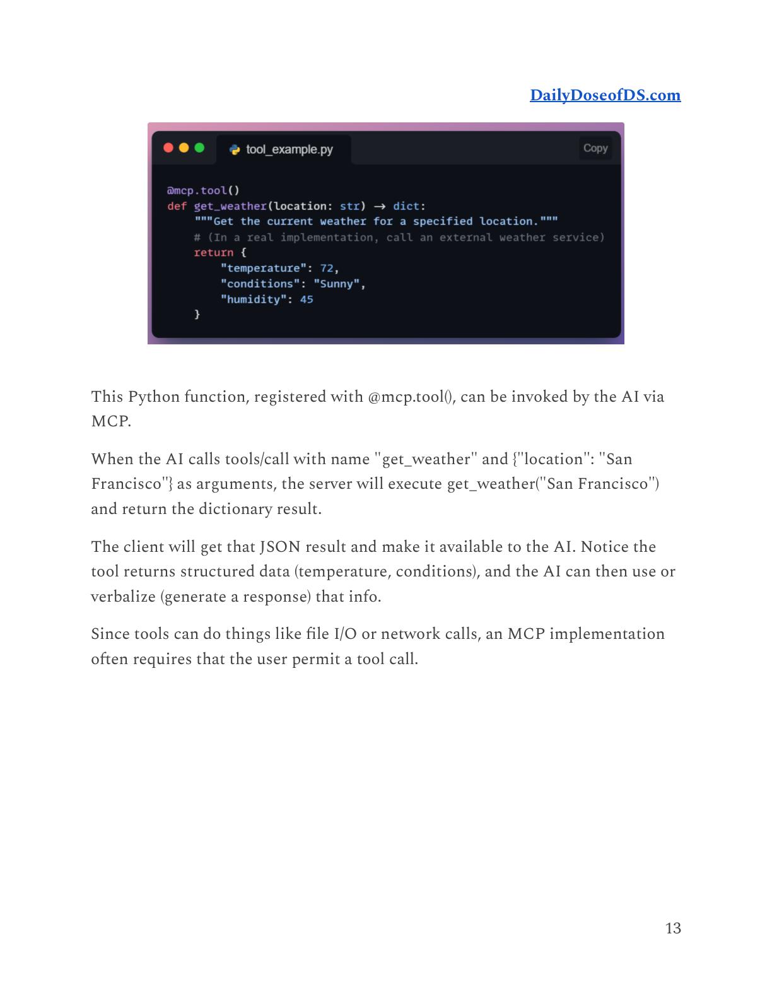


===== Rank 2: Page 13 | Score 15.7266 =====


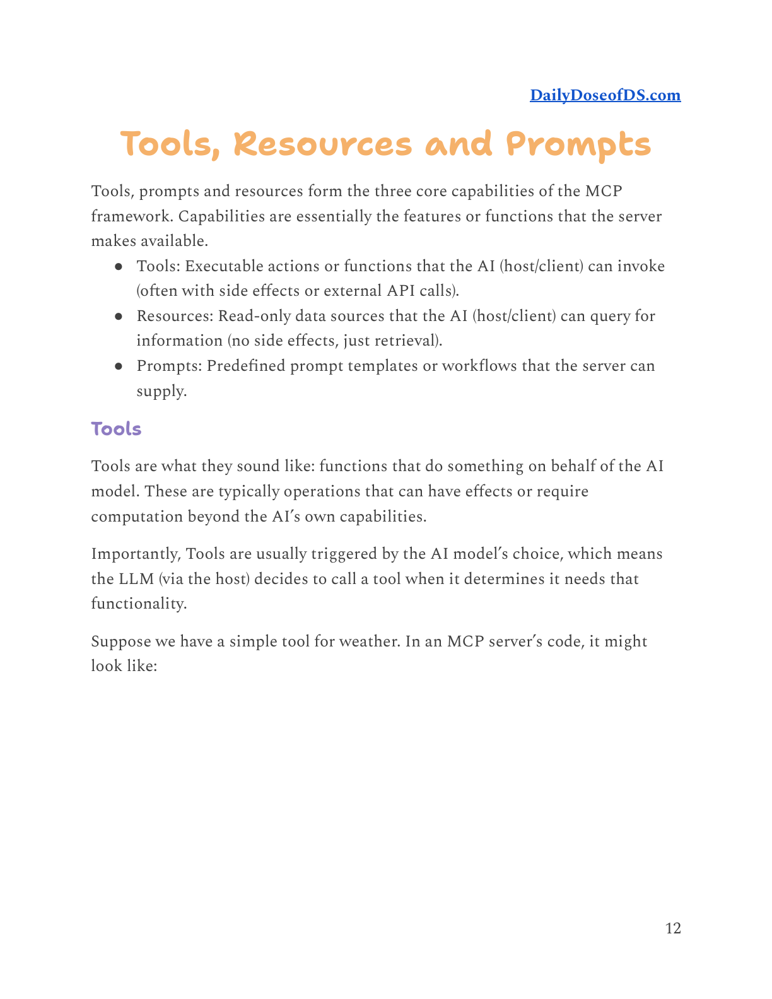


===== Rank 3: Page 27 | Score 15.7031 =====


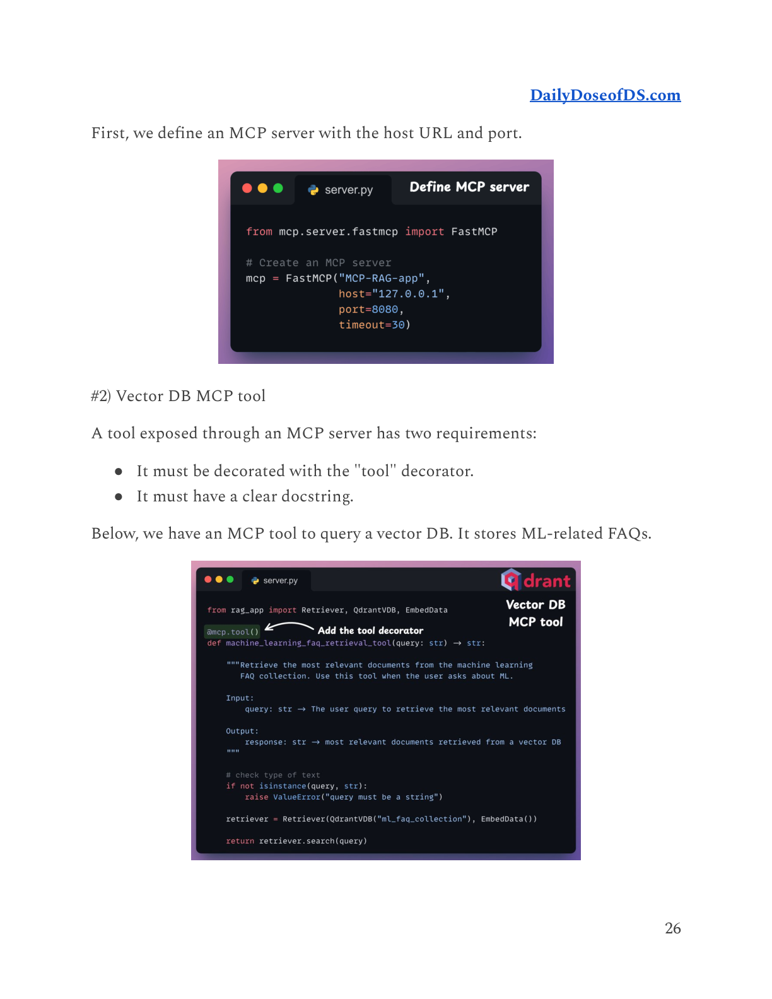



########################################
QUERY: How does MCP connect AI applications to external systems?
########################################

===== Rank 1: Page 8 | Score 19.3594 =====


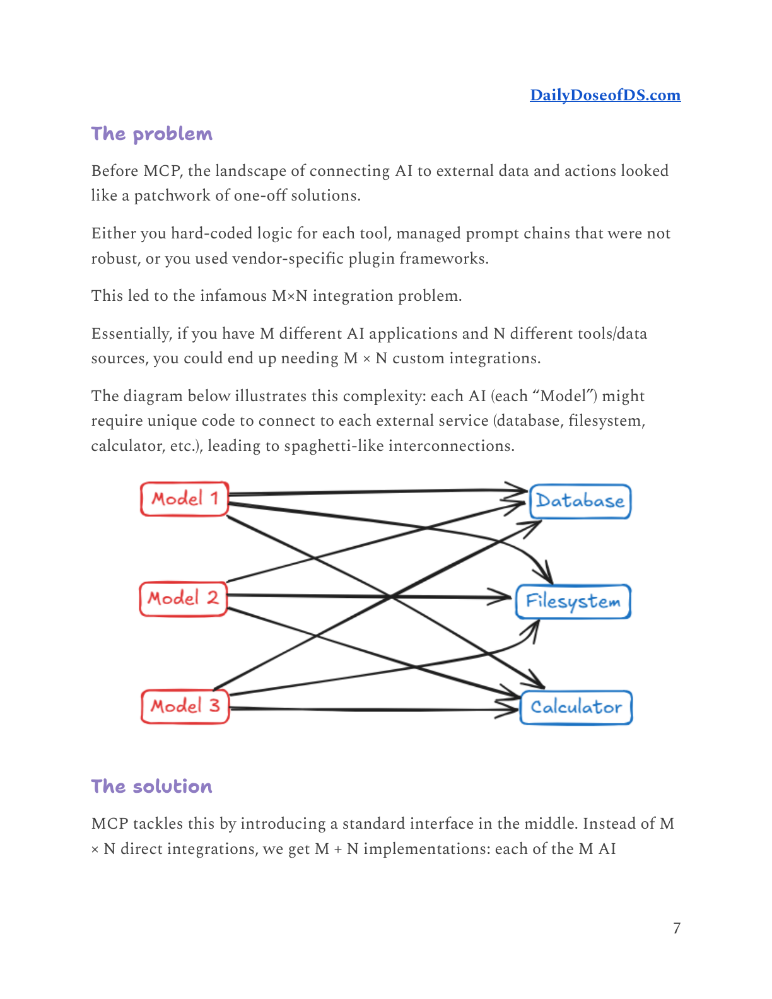


===== Rank 2: Page 6 | Score 19.2812 =====


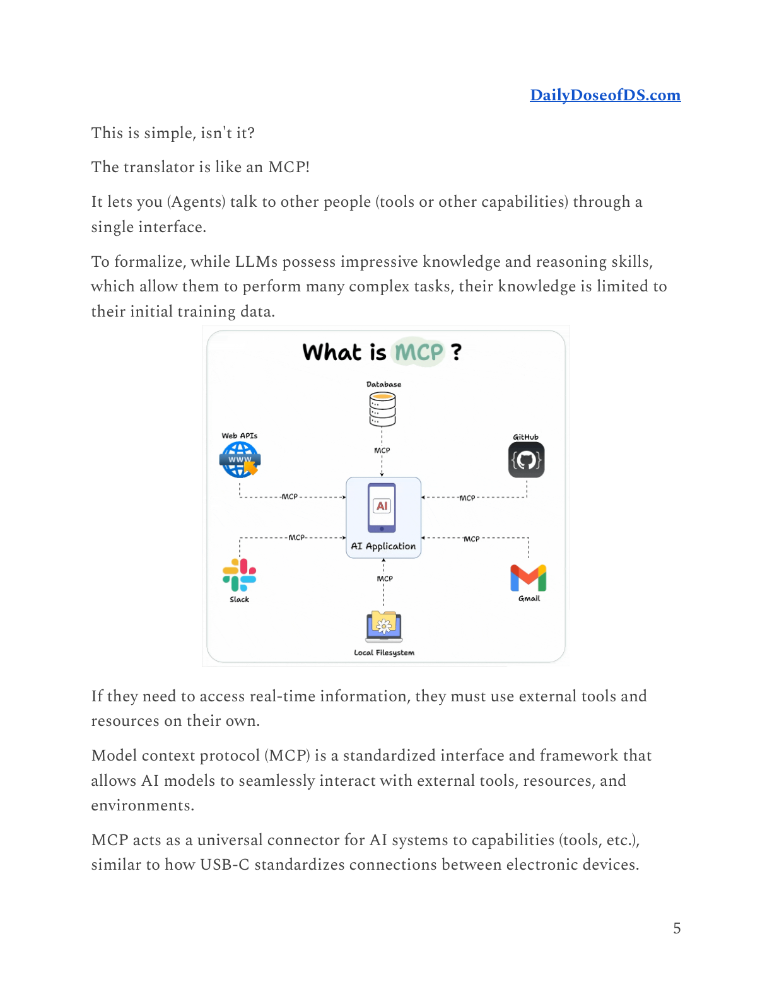


===== Rank 3: Page 7 | Score 18.4375 =====


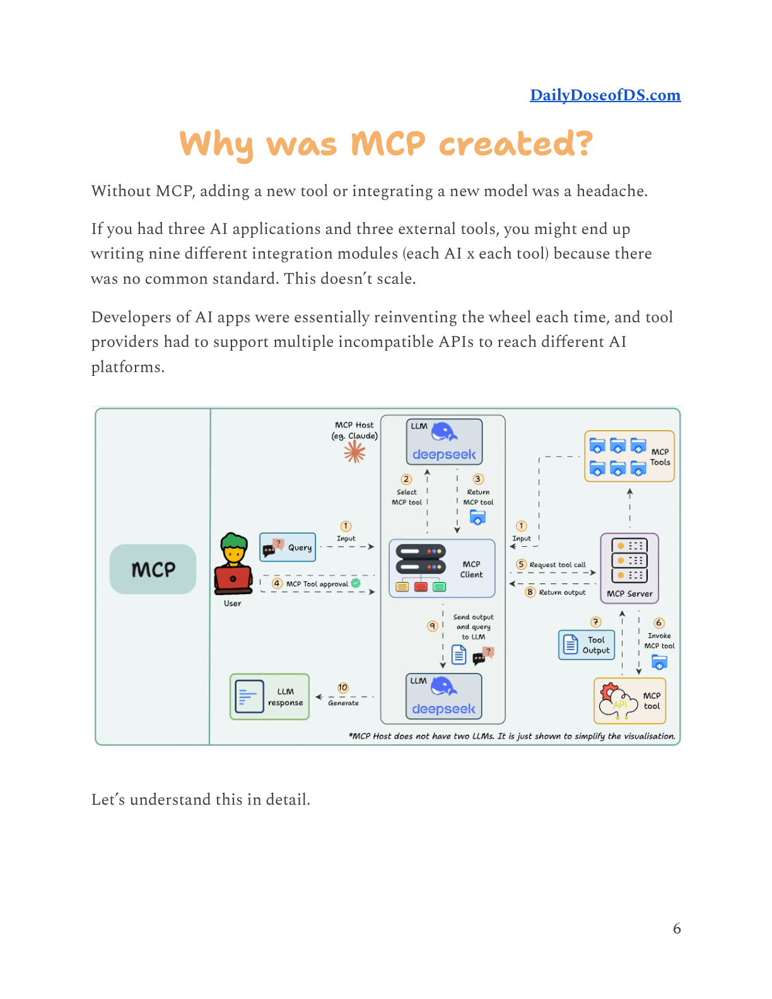

In [55]:
for q in queries:
    print("\n\n########################################")
    print("QUERY:", q)
    print("########################################")

    results = retrieve_pages(
        q,
        all_image_embeddings,
        pages,
        processor,
        model,
        top_k=3
    )

    show_results(results)

In [56]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
import torch

vlm_name = "Qwen/Qwen2.5-VL-3B-Instruct"

vlm_processor = AutoProcessor.from_pretrained(vlm_name)

vlm = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    vlm_name,
    torch_dtype=torch.float16,
    device_map="auto"
)

print("VLM loaded successfully!")

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/824 [00:00<?, ?it/s]

VLM loaded successfully!


In [57]:
from qwen_vl_utils import process_vision_info

def analyze_page_with_vlm(page_image, query):

    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": page_image,
                },
                {
                    "type": "text",
                    "text": f"""
You are analyzing a page retrieved from a document.

User question:
{query}

Analyze this page and extract information useful for answering
the question.

Focus on:
- important text
- components
- diagrams
- tables
- relationships
- arrows and connections
- visual structure

Only report information supported by the page.
Do not invent information.
""",
                },
            ],
        }
    ]

    text = vlm_processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    image_inputs, video_inputs = process_vision_info(messages)

    inputs = vlm_processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt",
    ).to(vlm.device)

    with torch.no_grad():
        generated_ids = vlm.generate(
            **inputs,
            max_new_tokens=250
        )

    generated_ids_trimmed = [
        out_ids[len(in_ids):]
        for in_ids, out_ids in zip(
            inputs.input_ids,
            generated_ids
        )
    ]

    result = vlm_processor.batch_decode(
        generated_ids_trimmed,
        skip_special_tokens=True,
        clean_up_tokenization_spaces=False
    )[0]

    return result

In [58]:
query = "How does MCP connect AI applications to external systems?"

results = retrieve_pages(
    query,
    all_image_embeddings,
    pages,
    processor,
    model,
    top_k=3
)

print("Retrieved pages:")

for r in results:
    print(
        f"Page {r['page']} | "
        f"Score: {r['score']:.4f}"
    )

Retrieved pages:
Page 8 | Score: 19.3594
Page 6 | Score: 19.2812
Page 7 | Score: 18.4375


In [59]:
top_page = results[0]["image"]

visual_context = analyze_page_with_vlm(
    top_page,
    query
)

print("\n===== VISUAL CONTEXT =====\n")
print(visual_context)


===== VISUAL CONTEXT =====

MCP connects AI applications to external systems by introducing a standard interface in the middle, instead of M × N direct integrations. This approach results in M + N implementations: each of the M AI models interacts with the standard interface rather than directly with the external systems (database, filesystem, calculator, etc.).


In [60]:
def analyze_retrieved_pages(results, query):
    visual_contexts = []

    for rank, result in enumerate(results, start=1):
        page_number = result["page"]

        print(
            f"\n===== Analyzing Rank {rank}: "
            f"Page {page_number} ====="
        )

        context = analyze_page_with_vlm(
            result["image"],
            query
        )

        visual_contexts.append({
            "page": page_number,
            "score": result["score"],
            "context": context
        })

        print(context)

    return visual_contexts

In [61]:
query = "How does MCP connect AI applications to external systems?"

results = retrieve_pages(
    query,
    all_image_embeddings,
    pages,
    processor,
    model,
    top_k=3
)

visual_results = analyze_retrieved_pages(
    results,
    query
)


===== Analyzing Rank 1: Page 8 =====
MCP connects AI applications to external systems by introducing a standard interface in the middle, instead of M × N direct integrations. This approach results in M + N implementations: each of the M AI models interacts with the standard interface rather than directly with the external systems (database, filesystem, calculator, etc.).

===== Analyzing Rank 2: Page 6 =====
The Model Context Protocol (MCP) connects AI applications to external systems through a standardized interface and framework. It allows AI models to seamlessly interact with external tools, resources, and environments. The diagram in the image illustrates how MCP works:

1. **AI Application**: This is the core AI model that needs access to external resources.
2. **MCP**: This acts as a universal connector, enabling seamless interaction between the AI application and external systems.
3. **External Systems**: These include various tools and resources such as web APIs, databases, Gi

In [62]:
visual_context = ""

for item in visual_results:
    visual_context += f"""
===== PAGE {item['page']} =====

{item['context']}

"""

In [63]:
print(visual_context)


===== PAGE 8 =====

MCP connects AI applications to external systems by introducing a standard interface in the middle, instead of M × N direct integrations. This approach results in M + N implementations: each of the M AI models interacts with the standard interface rather than directly with the external systems (database, filesystem, calculator, etc.).


===== PAGE 6 =====

The Model Context Protocol (MCP) connects AI applications to external systems through a standardized interface and framework. It allows AI models to seamlessly interact with external tools, resources, and environments. The diagram in the image illustrates how MCP works:

1. **AI Application**: This is the core AI model that needs access to external resources.
2. **MCP**: This acts as a universal connector, enabling seamless interaction between the AI application and external systems.
3. **External Systems**: These include various tools and resources such as web APIs, databases, GitHub, Slack, Gmail, and local fil

In [64]:
final_prompt = f"""
You are answering a question using retrieved evidence from an MCP document.

User question:
{query}

Retrieved visual evidence:

{visual_context}

Instructions:
- Answer the user's question using the evidence above.
- Explain the MCP architecture clearly.
- Explain the relationships between components.
- Include the M × N versus M + N concept.
- Do not invent information.
- Mention the relevant page numbers when referring to evidence.
"""

print(final_prompt)


You are answering a question using retrieved evidence from an MCP document.

User question:
How does MCP connect AI applications to external systems?

Retrieved visual evidence:


===== PAGE 8 =====

MCP connects AI applications to external systems by introducing a standard interface in the middle, instead of M × N direct integrations. This approach results in M + N implementations: each of the M AI models interacts with the standard interface rather than directly with the external systems (database, filesystem, calculator, etc.).


===== PAGE 6 =====

The Model Context Protocol (MCP) connects AI applications to external systems through a standardized interface and framework. It allows AI models to seamlessly interact with external tools, resources, and environments. The diagram in the image illustrates how MCP works:

1. **AI Application**: This is the core AI model that needs access to external resources.
2. **MCP**: This acts as a universal connector, enabling seamless interaction 

In [65]:
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "text",
                "text": final_prompt
            }
        ]
    }
]

In [66]:
text = vlm_processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

inputs = vlm_processor(
    text=[text],
    padding=True,
    return_tensors="pt"
).to(vlm.device)

with torch.no_grad():
    generated_ids = vlm.generate(
        **inputs,
        max_new_tokens=300
    )

generated_ids_trimmed = [
    out_ids[len(in_ids):]
    for in_ids, out_ids in zip(
        inputs.input_ids,
        generated_ids
    )
]

final_answer = vlm_processor.batch_decode(
    generated_ids_trimmed,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False
)[0]

print(final_answer)

MCP connects AI applications to external systems by introducing a standardized interface in the middle, which is different from direct M × N integrations. This approach results in M + N implementations, where each AI model interacts with the standard interface rather than directly with the external systems (such as databases, filesystems, calculators, etc.).

To understand this better, let's break down the MCP architecture and its components:

1. **AI Application**: This is the core AI model that needs access to external resources.
2. **MCP (Model Context Protocol)**: This acts as a universal connector, enabling seamless interaction between the AI application and external systems.
3. **External Systems**: These include various tools and resources such as web APIs, databases, GitHub, Slack, Gmail, and local filesystems.

The diagram in the image illustrates how MCP works:

1. **User Query**: The user initiates a query using an AI application.
2. **MCP Tool Selection**: The user selects 

In [67]:
def build_visual_context(visual_results):
    context_parts = []

    for item in visual_results:
        page = item["page"]
        score = item["score"]
        context = item["context"]

        context_parts.append(
            f"""
[SOURCE: Page {page}]
[RETRIEVAL SCORE: {score:.4f}]

{context}
"""
        )

    return "\n".join(context_parts)

In [68]:
visual_context = build_visual_context(visual_results)

print(visual_context)


[SOURCE: Page 8]
[RETRIEVAL SCORE: 19.3594]

MCP connects AI applications to external systems by introducing a standard interface in the middle, instead of M × N direct integrations. This approach results in M + N implementations: each of the M AI models interacts with the standard interface rather than directly with the external systems (database, filesystem, calculator, etc.).


[SOURCE: Page 6]
[RETRIEVAL SCORE: 19.2812]

The Model Context Protocol (MCP) connects AI applications to external systems through a standardized interface and framework. It allows AI models to seamlessly interact with external tools, resources, and environments. The diagram in the image illustrates how MCP works:

1. **AI Application**: This is the core AI model that needs access to external resources.
2. **MCP**: This acts as a universal connector, enabling seamless interaction between the AI application and external systems.
3. **External Systems**: These include various tools and resources such as web AP

In [69]:
final_prompt = f"""
You are an answer-generation system for a document question-answering application.

Answer the user's question using ONLY the retrieved evidence below.

USER QUESTION:
{query}

RETRIEVED EVIDENCE:
{visual_context}

Instructions:

1. Give a clear and accurate answer.
2. Do not invent information.
3. If information comes from a particular page, cite it as [Page X].
4. Preserve important relationships shown in diagrams.
5. Distinguish between information explicitly supported by the evidence
   and information that cannot be determined.
6. Do not mention retrieval scores unless necessary.
7. Do not cite a page for information that is not supported by that page.

USER-FACING ANSWER:
"""

In [70]:
text = vlm_processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

inputs = vlm_processor(
    text=[text],
    padding=True,
    return_tensors="pt"
).to(vlm.device)

with torch.no_grad():
    generated_ids = vlm.generate(
        **inputs,
        max_new_tokens=400
    )

generated_ids_trimmed = [
    out_ids[len(in_ids):]
    for in_ids, out_ids in zip(
        inputs.input_ids,
        generated_ids
    )
]

final_answer = vlm_processor.batch_decode(
    generated_ids_trimmed,
    skip_special_tokens=True,
    clean_up_tokenization_spaces=False
)[0]

print(final_answer)

MCP connects AI applications to external systems by introducing a standardized interface in the middle, which is different from direct M × N integrations. This approach results in M + N implementations, where each AI model interacts with the standard interface rather than directly with the external systems.

To understand the MCP architecture, let's break down the components involved:

1. **AI Application**: This is the core AI model that needs access to external resources.
2. **MCP (Model Context Protocol)**: This acts as a universal connector, enabling seamless interaction between the AI application and external systems.
3. **External Systems**: These include various tools and resources such as web APIs, databases, GitHub, Slack, Gmail, and local filesystems.

The diagram in the image illustrates how MCP works:

1. **User Query**: The user initiates a query using an AI application.
2. **MCP Tool Selection**: The user selects an appropriate MCP tool based on their needs.
3. **Tool App

In [71]:
import fitz

pdf = fitz.open("mcp.pdf")

text_documents = []

for page_number, page in enumerate(pdf, start=1):
    text = page.get_text("text").strip()

    if text:
        text_documents.append({
            "page": page_number,
            "text": text
        })

pdf.close()

print("Pages with extracted text:", len(text_documents))

Pages with extracted text: 74


In [72]:
print(text_documents[5])

{'page': 6, 'text': "DailyDoseofDS.com \nThis is simple, isn't it? \n \nThe translator is like an MCP! \n \nIt lets you (Agents) talk to other people (tools or other capabilities) through a \nsingle interface. \n \nTo formalize, while LLMs possess impressive knowledge and reasoning skills, \nwhich allow them to perform many complex tasks, their knowledge is limited to \ntheir initial training data. \n \n \nIf they need to access real-time information, they must use external tools and \nresources on their own. \n \nModel context protocol (MCP) is a standardized interface and framework that \nallows AI models to seamlessly interact with external tools, resources, and \nenvironments. \n \nMCP acts as a universal connector for AI systems to capabilities (tools, etc.), \nsimilar to how USB-C standardizes connections between electronic devices. \n5"}


In [74]:
!pip install -q -U langchain-text-splitters

In [75]:
from langchain_text_splitters import RecursiveCharacterTextSplitter

splitter = RecursiveCharacterTextSplitter(
    chunk_size=800,
    chunk_overlap=100
)

text_chunks = []

for doc in text_documents:
    chunks = splitter.split_text(doc["text"])

    for chunk in chunks:
        text_chunks.append({
            "page": doc["page"],
            "text": chunk
        })

print("Total text chunks:", len(text_chunks))

Total text chunks: 85


In [76]:
!pip install -q -U sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.8/739.8 kB 14.2 MB/s eta 0:00:00


In [77]:
from sentence_transformers import SentenceTransformer

embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

print("Embedding model loaded!")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 90.9MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Embedding model loaded!


In [78]:
texts = [chunk["text"] for chunk in text_chunks]

print("Number of texts:", len(texts))
print("First text:\n", texts[0])

Number of texts: 85
First text:
 MCP
2025 EDITION
THE ILLUSTRATED
GUIDEBOOK 
Avi Chawla & Akshay Pachaar
DailyDoseofDS.com
Daily Dose of
Data Science
FREE


In [79]:
text_embeddings = embedding_model.encode(
    texts,
    convert_to_tensor=True
)

print("Embedding shape:", text_embeddings.shape)

Embedding shape: torch.Size([85, 384])


In [81]:
query = "How does MCP connect AI applications to external systems?"
query_embedding = embedding_model.encode(
    query,
    convert_to_tensor=True
)

print("Query embedding shape:", query_embedding.shape)

Query embedding shape: torch.Size([384])


In [82]:
from sentence_transformers.util import cos_sim

similarities = cos_sim(
    query_embedding,
    text_embeddings
)[0]

print("Similarity shape:", similarities.shape)

Similarity shape: torch.Size([85])


In [83]:
top_k = 5

top_scores, top_indices = similarities.topk(top_k)

for score, index in zip(top_scores, top_indices):
    chunk = text_chunks[index.item()]

    print("=" * 70)
    print("Page:", chunk["page"])
    print("Score:", round(score.item(), 4))
    print("Text:")
    print(chunk["text"])

Page: 6
Score: 0.7586
Text:
environments. 
 
MCP acts as a universal connector for AI systems to capabilities (tools, etc.), 
similar to how USB-C standardizes connections between electronic devices. 
5
Page: 8
Score: 0.6538
Text:
DailyDoseofDS.com 
The problem 
Before MCP, the landscape of connecting AI to external data and actions looked 
like a patchwork of one-oﬀ solutions. 
Either you hard-coded logic for each tool, managed prompt chains that were not 
robust, or you used vendor-speciﬁc plugin frameworks. 
This led to the infamous M×N integration problem. 
Essentially, if you have M diﬀerent AI applications and N diﬀerent tools/data 
sources, you could end up needing M × N custom integrations. 
The diagram below illustrates this complexity: each AI (each “Model”) might 
require unique code to connect to each external service (database, ﬁlesystem, 
calculator, etc.), leading to spaghetti-like interconnections. 
 
The solution 
MCP tackles this by introducing a standard interface in

In [84]:
query = "How does MCP connect AI applications to external systems?"

In [85]:
from sentence_transformers.util import cos_sim

query_embedding = embedding_model.encode(
    query,
    convert_to_tensor=True
)

similarities = cos_sim(
    query_embedding,
    text_embeddings
)[0]

top_k = 5
text_scores, text_indices = similarities.topk(top_k)

text_results = []

for score, index in zip(text_scores, text_indices):
    chunk = text_chunks[index.item()]

    text_results.append({
        "page": chunk["page"],
        "score": score.item(),
        "text": chunk["text"]
    })

print("TEXT RETRIEVAL")
print("=" * 70)

for rank, result in enumerate(text_results, 1):
    print(f"Rank {rank}")
    print(f"Page: {result['page']}")
    print(f"Score: {result['score']:.4f}")
    print(result["text"][:300])
    print()

TEXT RETRIEVAL
Rank 1
Page: 6
Score: 0.7586
environments. 
 
MCP acts as a universal connector for AI systems to capabilities (tools, etc.), 
similar to how USB-C standardizes connections between electronic devices. 
5

Rank 2
Page: 8
Score: 0.6538
DailyDoseofDS.com 
The problem 
Before MCP, the landscape of connecting AI to external data and actions looked 
like a patchwork of one-oﬀ solutions. 
Either you hard-coded logic for each tool, managed prompt chains that were not 
robust, or you used vendor-speciﬁc plugin frameworks. 
This led to th

Rank 3
Page: 13
Score: 0.6224
computation beyond the AI’s own capabilities. 
Importantly, Tools are usually triggered by the AI model’s choice, which means 
the LLM (via the host) decides to call a tool when it determines it needs that 
functionality. 
Suppose we have a simple tool for weather. In an MCP server’s code, it might 

Rank 4
Page: 7
Score: 0.6128
DailyDoseofDS.com 
Why was MCP created? 
Without MCP, adding a new tool or integrating a

In [86]:
query_inputs = processor.process_queries([query]).to(model.device)

with torch.no_grad():
    query_embeddings = model(**query_inputs).embeddings

visual_scores = processor.score_retrieval(
    query_embeddings,
    all_image_embeddings.to(model.device)
)[0]

visual_top_scores, visual_top_indices = visual_scores.topk(5)

visual_results = []

for score, index in zip(visual_top_scores, visual_top_indices):
    page_number = index.item() + 1

    visual_results.append({
        "page": page_number,
        "score": score.item(),
        "image": pages[page_number - 1]
    })

print("VISUAL RETRIEVAL")
print("=" * 70)

for rank, result in enumerate(visual_results, 1):
    print(f"Rank {rank}")
    print(f"Page: {result['page']}")
    print(f"Score: {result['score']:.4f}")
    print()

VISUAL RETRIEVAL
Rank 1
Page: 8
Score: 19.3594

Rank 2
Page: 6
Score: 19.2812

Rank 3
Page: 7
Score: 18.4375

Rank 4
Page: 21
Score: 18.2031

Rank 5
Page: 10
Score: 18.0781



In [87]:
page_number = 8
page_image = pages[page_number - 1]

prompt = """
Analyze this PDF page for a multimodal RAG system.

Identify:
1. The main topic.
2. Important text.
3. Important visual elements such as diagrams, boxes, arrows, tables, or relationships.
4. Explain what the visual elements mean.
5. Describe the relationships between the components.

Do not invent information that is not visible on the page.
Return a concise structured explanation.
"""

In [88]:
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": page_image,
            },
            {
                "type": "text",
                "text": prompt,
            },
        ],
    }
]

text = vlm_processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
)

inputs = vlm_processor(
    text=[text],
    images=[page_image],
    return_tensors="pt",
).to(vlm.device)

with torch.no_grad():
    output_ids = vlm.generate(
        **inputs,
        max_new_tokens=300,
    )

generated_ids = output_ids[:, inputs.input_ids.shape[1]:]

answer = vlm_processor.batch_decode(
    generated_ids,
    skip_special_tokens=True,
)[0]

print(answer)

### Analysis of the PDF Page

#### 1. The Main Topic
The main topic of the page is **MCP (Model Connection Platform)** and its solution to the problem of integrating AI with external data and actions.

#### 2. Important Text
- **The Problem:**
  - Before MCP, connecting AI to external data and actions was patchwork and one-off solutions.
  - Hard-coded logic, managed prompt chains, or vendor-specific plugin frameworks were used.
  - This led to the infamous M×N integration problem.
  - If there are M different AI applications and N different tools/data sources, you could end up needing M × N custom integrations.
  
- **The Solution:**
  - MCP introduces a standard interface in the middle.
  - Instead of M × N direct integrations, we get M + N implementations: each of the M AI models connects to the platform through the standard interface.

#### 3. Important Visual Elements
- **Diagram:**
  - A diagram illustrating the complexity of connecting multiple AI models (each represented by a r

In [89]:
def analyze_page_with_vlm(page_number, page_image):
    prompt = """
Analyze this PDF page for a multimodal RAG system.

Return your answer using exactly these sections:

TOPIC:
Give the main topic of the page.

TEXT_EVIDENCE:
List the important information explicitly visible in the page text.

VISUAL_ELEMENTS:
Describe diagrams, boxes, tables, arrows, or other important visual elements.

RELATIONSHIPS:
Explain the relationships or flow shown by the visual elements.

GROUNDING:
Mention only information that is visible on this page. Do not guess or add outside information.
"""

    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": page_image,
                },
                {
                    "type": "text",
                    "text": prompt,
                },
            ],
        }
    ]

    text = vlm_processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
    )

    inputs = vlm_processor(
        text=[text],
        images=[page_image],
        return_tensors="pt",
    ).to(vlm.device)

    with torch.no_grad():
        output_ids = vlm.generate(
            **inputs,
            max_new_tokens=350,
        )

    generated_ids = output_ids[:, inputs.input_ids.shape[1]:]

    result = vlm_processor.batch_decode(
        generated_ids,
        skip_special_tokens=True,
    )[0]

    return {
        "page": page_number,
        "visual_context": result
    }

In [90]:
page6_result = analyze_page_with_vlm(
    6,
    pages[5]
)

print(page6_result["visual_context"])

**TOPIC:**
Model Context Protocol (MCP)

**TEXT_EVIDENCE:**
- The translator is like an MCP!
- It lets you (Agents) talk to other people (tools or other capabilities) through a single interface.
- To formalize, while LLMs possess impressive knowledge and reasoning skills, which allow them to perform many complex tasks, their knowledge is limited to their initial training data.
- Model context protocol (MCP) is a standardized interface and framework that allows AI models to seamlessly interact with external tools, resources, and environments.
- MCP acts as a universal connector for AI systems to capabilities (tools, etc.), similar to how USB-C standardizes connections between electronic devices.

**VISUAL_ELEMENTS:**
- A diagram labeled "What is MCP?" showing various components connected by lines labeled "MCP."
  - Components include Web APIs, Database, GitHub, AI Application, Local Filesystem, Slack, and Gmail.
  - Arrows indicate the flow from one component to another through the MCP.

In [91]:
page8_result = analyze_page_with_vlm(
    8,
    pages[7]
)

print(page8_result["visual_context"])

**TOPIC:**
Connecting AI to External Data and Actions

**TEXT_EVIDENCE:**
- Before MCP, the landscape of connecting AI to external data and actions looked like a patchwork of one-off solutions.
- Either you hard-coded logic for each tool, managed prompt chains that were not robust, or you used vendor-specific plugin frameworks.
- This led to the infamous M×N integration problem.
- Essentially, if you have M different AI applications and N different tools/data sources, you could end up needing M × N custom integrations.
- The diagram below illustrates this complexity: each AI (each “Model”) might require unique code to connect to each external service (database, filesystem, calculator, etc.), leading to spaghetti-like interconnections.
- MCP tackles this by introducing a standard interface in the middle. Instead of M × N direct integrations, we get M + N implementations: each of the M AI

**VISUAL_ELEMENTS:**
- A diagram illustrating the complexity of connecting AI to external services,

In [92]:
visual_contexts = []

visual_contexts.append(page6_result)

visual_contexts.append(page8_result)

print("Visual contexts:", len(visual_contexts))

for item in visual_contexts:
    print("Page:", item["page"])

Visual contexts: 2
Page: 6
Page: 8


In [93]:
def visual_rag_retrieve(
    query,
    image_embeddings,
    pages,
    processor,
    model,
    top_k=3
):
    # 1. Retrieve pages using ColPali
    query_inputs = processor.process_queries([query]).to(model.device)

    with torch.no_grad():
        query_embeddings = model(**query_inputs).embeddings

    scores = processor.score_retrieval(
        query_embeddings,
        image_embeddings.to(model.device)
    )[0]

    top_scores, top_indices = scores.topk(top_k)

    results = []

    # 2. Analyze each retrieved page with VLM
    for score, index in zip(top_scores, top_indices):

        page_number = index.item() + 1
        page_image = pages[page_number - 1]

        visual_analysis = analyze_page_with_vlm(
            page_number,
            page_image
        )

        results.append({
            "page": page_number,
            "retrieval_score": score.item(),
            "visual_context": visual_analysis["visual_context"]
        })

    return results

In [94]:
query = "How does MCP connect AI applications to external systems?"

visual_results = visual_rag_retrieve(
    query,
    all_image_embeddings,
    pages,
    processor,
    model,
    top_k=3
)

for result in visual_results:
    print("=" * 70)
    print("Page:", result["page"])
    print("ColPali score:", round(result["retrieval_score"], 4))
    print(result["visual_context"])

Page: 8
ColPali score: 19.3594
**TOPIC:**
Connecting AI to External Data and Actions

**TEXT_EVIDENCE:**
- Before MCP, the landscape of connecting AI to external data and actions looked like a patchwork of one-off solutions.
- Either you hard-coded logic for each tool, managed prompt chains that were not robust, or you used vendor-specific plugin frameworks.
- This led to the infamous M×N integration problem.
- Essentially, if you have M different AI applications and N different tools/data sources, you could end up needing M × N custom integrations.
- The diagram below illustrates this complexity: each AI (each “Model”) might require unique code to connect to each external service (database, filesystem, calculator, etc.), leading to spaghetti-like interconnections.
- MCP tackles this by introducing a standard interface in the middle. Instead of M × N direct integrations, we get M + N implementations: each of the M AI

**VISUAL_ELEMENTS:**
- A diagram illustrating the complexity of conn

In [95]:
def build_hybrid_context(text_results, visual_results):

    context_parts = []

    # -------------------------
    # TEXT EVIDENCE
    # -------------------------
    context_parts.append("===== TEXT EVIDENCE =====")

    for result in text_results:
        context_parts.append(
            f"""
[TEXT SOURCE: Page {result['page']}]

{result['text']}
"""
        )

    # -------------------------
    # VISUAL EVIDENCE
    # -------------------------
    context_parts.append("\n===== VISUAL EVIDENCE =====")

    for result in visual_results:
        context_parts.append(
            f"""
[VISUAL SOURCE: Page {result['page']}]
[COLPALI SCORE: {result['retrieval_score']:.4f}]

{result['visual_context']}
"""
        )

    return "\n".join(context_parts)

In [96]:
hybrid_context = build_hybrid_context(
    text_results,
    visual_results
)

print(hybrid_context)

===== TEXT EVIDENCE =====

[TEXT SOURCE: Page 6]

environments. 
 
MCP acts as a universal connector for AI systems to capabilities (tools, etc.), 
similar to how USB-C standardizes connections between electronic devices. 
5


[TEXT SOURCE: Page 8]

DailyDoseofDS.com 
The problem 
Before MCP, the landscape of connecting AI to external data and actions looked 
like a patchwork of one-oﬀ solutions. 
Either you hard-coded logic for each tool, managed prompt chains that were not 
robust, or you used vendor-speciﬁc plugin frameworks. 
This led to the infamous M×N integration problem. 
Essentially, if you have M diﬀerent AI applications and N diﬀerent tools/data 
sources, you could end up needing M × N custom integrations. 
The diagram below illustrates this complexity: each AI (each “Model”) might 
require unique code to connect to each external service (database, ﬁlesystem, 
calculator, etc.), leading to spaghetti-like interconnections. 
 
The solution 
MCP tackles this by introducing a st

In [97]:
def build_answer_prompt(query, hybrid_context):

    return f"""
You are answering a question using evidence retrieved from a PDF.

USER QUESTION:
{query}

RETRIEVED EVIDENCE:
{hybrid_context}

INSTRUCTIONS:

1. Answer the user's question using only the retrieved evidence.
2. Use both text and visual evidence when useful.
3. Do not invent information that is not supported by the evidence.
4. If visual evidence describes a diagram, explain the relationships shown in it.
5. Cite the relevant PDF page after important claims using [Page X].
6. If the evidence is insufficient, clearly say that it is insufficient.
7. Keep the answer clear and concise.

ANSWER:
"""

In [98]:
query = "How does MCP connect AI applications to external systems?"

answer_prompt = build_answer_prompt(
    query,
    hybrid_context
)

print(answer_prompt[:3000])


You are answering a question using evidence retrieved from a PDF.

USER QUESTION:
How does MCP connect AI applications to external systems?

RETRIEVED EVIDENCE:
===== TEXT EVIDENCE =====

[TEXT SOURCE: Page 6]

environments. 
 
MCP acts as a universal connector for AI systems to capabilities (tools, etc.), 
similar to how USB-C standardizes connections between electronic devices. 
5


[TEXT SOURCE: Page 8]

DailyDoseofDS.com 
The problem 
Before MCP, the landscape of connecting AI to external data and actions looked 
like a patchwork of one-oﬀ solutions. 
Either you hard-coded logic for each tool, managed prompt chains that were not 
robust, or you used vendor-speciﬁc plugin frameworks. 
This led to the infamous M×N integration problem. 
Essentially, if you have M diﬀerent AI applications and N diﬀerent tools/data 
sources, you could end up needing M × N custom integrations. 
The diagram below illustrates this complexity: each AI (each “Model”) might 
require unique code to connect to

In [100]:
!pip install -q -U groq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 4.5 MB/s eta 0:00:00


In [101]:
from groq import Groq

print("Groq SDK loaded successfully!")


Groq SDK loaded successfully!


In [102]:
from google.colab import userdata

GROQ_API_KEY = userdata.get("GROQ_API_KEY")

print("API key loaded:", GROQ_API_KEY is not None)

API key loaded: True


In [103]:
response = client.chat.completions.create(
    model="llama-3.3-70b-versatile",
    messages=[
        {
            "role": "system",
            "content": "You are a helpful grounded PDF question-answering assistant."
        },
        {
            "role": "user",
            "content": answer_prompt
        }
    ],
    temperature=0
)

final_answer = response.choices[0].message.content

print(final_answer)

NameError: name 'client' is not defined

In [104]:
from google.colab import userdata

GROQ_API_KEY = userdata.get("GROQ_API_KEY")

print("API key loaded:", GROQ_API_KEY is not None)

API key loaded: True


In [105]:
from groq import Groq

client = Groq(api_key=GROQ_API_KEY)

print("Groq client initialized!")

Groq client initialized!


In [106]:
response = client.chat.completions.create(
    model="llama-3.3-70b-versatile",
    messages=[
        {
            "role": "system",
            "content": "You are a helpful grounded PDF question-answering assistant."
        },
        {
            "role": "user",
            "content": answer_prompt
        }
    ],
    temperature=0
)

final_answer = response.choices[0].message.content

print(final_answer)

AuthenticationError: Error code: 401 - {'error': {'message': 'Invalid API Key', 'type': 'invalid_request_error', 'code': 'invalid_api_key'}}

In [107]:
from google.colab import userdata

GROQ_API_KEY = userdata.get("GROQ_API_KEY")

print("Loaded:", GROQ_API_KEY is not None)
print("Length:", len(GROQ_API_KEY) if GROQ_API_KEY else 0)
print("Starts with gsk_:", GROQ_API_KEY.startswith("gsk_") if GROQ_API_KEY else False)

Loaded: True
Length: 111
Starts with gsk_: True


In [110]:
from google.colab import userdata
from groq import Groq

GROQ_API_KEY = userdata.get("GROQ_API_KEY")

client = Groq(api_key=GROQ_API_KEY)

print("Groq client initialized!")

Groq client initialized!


In [111]:
response = client.chat.completions.create(
    model="llama-3.3-70b-versatile",
    messages=[
        {
            "role": "user",
            "content": "Say hello in one sentence."
        }
    ],
    temperature=0
)

print(response.choices[0].message.content)

NotFoundError: Error code: 404 - {'error': {'message': 'The model `llama-3.3-70b-versatile` does not exist or you do not have access to it.', 'type': 'invalid_request_error', 'code': 'model_not_found'}}

In [112]:
response = client.chat.completions.create(
    model="openai/gpt-oss-120b",
    messages=[
        {
            "role": "user",
            "content": "Say hello in one sentence."
        }
    ],
    temperature=0
)

print(response.choices[0].message.content)

Hello! I hope you're having a wonderful day.


In [113]:
response = client.chat.completions.create(
    model="openai/gpt-oss-120b",
    messages=[
        {
            "role": "system",
            "content": "You are a helpful grounded PDF question-answering assistant."
        },
        {
            "role": "user",
            "content": answer_prompt
        }
    ],
    temperature=0
)

final_answer = response.choices[0].message.content

print(final_answer)

MCP (Model Context Protocol) works as a **standard, middle‑layer interface** that lets an AI application (the “agent” or LLM) talk to any external tool, service or environment through a single, uniform connector.

* It **standardizes the connection** so the AI does not need custom code for each tool. Instead of writing M × N integrations (one for every AI app × every external service), you only implement M AI‑side adapters and N tool‑side adapters, and MCP routes the calls between them [Page 8].  
* In the diagram on page 6, MCP is shown linking components such as Web APIs, databases, GitHub, Slack, Gmail, local filesystems, etc., to an AI application via the same “MCP” line—much like a USB‑C port that works with many devices [Page 6].  
* When the LLM decides it needs a capability (e.g., a weather lookup), it **triggers a tool** through the MCP host; the MCP server discovers the appropriate tool, the agent invokes it, and the result is returned to the model [Page 13].  
* An MCP clien

In [114]:
response = client.chat.completions.create(
    model="openai/gpt-oss-120b",
    messages=[
        {
            "role": "system",
            "content": """
You are a grounded PDF question-answering assistant.

Answer only from the supplied evidence.
Do not invent information.
Use [Page X] citations.
If the evidence is insufficient, say so.
"""
        },
        {
            "role": "user",
            "content": answer_prompt
        }
    ],
    temperature=0,
    max_completion_tokens=800
)

final_answer = response.choices[0].message.content

print(final_answer)

MCP works as a **standard middle‑layer “connector”** that sits between an AI model (or AI‑powered application) and any external capability such as a web API, database, file system, GitHub, Slack, Gmail, etc.  

* The protocol defines a single, uniform interface that an AI agent uses to **discover** and **invoke** tools. The agent sends a request to an MCP server, which then routes the call to the appropriate external service. Because every AI app talks to the same MCP interface and every tool is exposed through the same MCP API, each side only needs one integration instead of a custom M × N integration for every AI‑tool pair【Page 6】.  

* Visually, the diagram on page 6 shows an AI Application, a Local Filesystem, a Database, Web APIs, GitHub, Slack, Gmail and other resources all linked through “MCP,” illustrating how the protocol standardizes those connections【Page 6】.  

* The solution diagram on page 8 explains that MCP replaces the tangled “spaghetti” of direct connections with a *

In [118]:
def build_faithfulness_prompt(query, hybrid_context, final_answer):

    return f"""
You are a strict evaluator for a Retrieval-Augmented Generation system.

Your task is to determine whether the generated answer is supported
by the retrieved evidence.

QUESTION:
{query}

RETRIEVED EVIDENCE:
{hybrid_context}

GENERATED ANSWER:
{final_answer}

Evaluate the answer using these rules:

1. Identify the important factual claims in the answer.
2. For each claim, determine whether the retrieved evidence supports it.
3. Mark a claim as SUPPORTED if the evidence directly supports it.
4. Mark a claim as UNSUPPORTED if the evidence does not support it.
5. Do not use outside knowledge to justify a claim.
6. If the evidence is ambiguous, mark the claim as UNSUPPORTED.
7. Ignore harmless wording differences.

Return exactly this format:

FAITHFULNESS: PASS or FAIL

CLAIMS:
- Claim: <claim>
  STATUS: SUPPORTED or UNSUPPORTED
  SOURCE: <Page X or NONE>
  REASON: <short explanation>

OVERALL_REASON:
<short explanation>
"""

In [117]:
evaluation_prompt = build_faithfulness_prompt(
    query,
    hybrid_context,
    final_answer
)

evaluation_response = client.chat.completions.create(
    model="openai/gpt-oss-120b",
    messages=[
        {
            "role": "system",
            "content": "You are a strict RAG evaluation system."
        },
        {
            "role": "user",
            "content": evaluation_prompt
        }
    ],
    temperature=0,
    max_completion_tokens=1000
)

evaluation = evaluation_response.choices[0].message.content

print(evaluation)

In [120]:
print("STEP 1")

print("client exists:", "client" in globals())

if "client" in globals():
    print("Client type:", type(client))

print("STEP 2")

STEP 1
client exists: True
Client type: <class 'groq.Groq'>
STEP 2


In [121]:
print("Calling Groq...")

response = client.chat.completions.create(
    model="openai/gpt-oss-120b",
    messages=[
        {
            "role": "user",
            "content": "Reply with exactly: EVALUATOR WORKING"
        }
    ],
    max_completion_tokens=50
)

print("Groq call finished")
print(response)

Calling Groq...
Groq call finished
ChatCompletion(id='chatcmpl-f809a1fa-31ee-4dc0-ac41-567df1505fb3', choices=[Choice(finish_reason='length', index=0, logprobs=None, message=ChatCompletionMessage(content='', role='assistant', annotations=None, executed_tools=None, function_call=None, reasoning='The user asks: "Reply with exactly: EVALUATOR WORKING". So we need to output exactly that string, no extra spaces or punctuation. Just "EVALUATOR WORKING". Ensure no additional content.', tool_calls=None))], created=1789392064, model='openai/gpt-oss-120b', object='chat.completion', mcp_list_tools=None, service_tier='on_demand', system_fingerprint='fp_5a93aea882', usage=CompletionUsage(completion_tokens=50, prompt_tokens=80, total_tokens=130, completion_time=0.104147935, completion_tokens_details=CompletionTokensDetails(reasoning_tokens=44), prompt_time=0.00296778, prompt_tokens_details=None, queue_time=0.16991148, total_time=0.107115715), usage_breakdown=None, x_groq=XGroq(id='req_01m2g183nce5ab

In [128]:
import re

def normalize_text(text):
    text = text.lower()
    text = re.sub(r"[^a-z0-9\s]", " ", text)
    return set(text.split())


def claim_supported(claim, evidence, threshold=0.30):
    claim_words = normalize_text(claim)
    evidence_words = normalize_text(evidence)

    if not claim_words:
        return False, 0.0

    overlap = claim_words.intersection(evidence_words)

    score = len(overlap) / len(claim_words)

    return score >= threshold, score

In [123]:
claim = "MCP provides a standard middle-layer interface"

evidence = """
MCP is a standardized interface and framework that allows AI models
to seamlessly interact with external tools, resources, and environments.
MCP acts as a universal connector for AI systems.
"""

supported, score = claim_supported(claim, evidence)

print("Supported:", supported)
print("Overlap score:", round(score, 3))

Supported: True
Overlap score: 0.429


In [124]:
claim = "MCP encrypts all communication between AI applications and tools"

supported, score = claim_supported(claim, evidence)

print("Supported:", supported)
print("Overlap score:", round(score, 3))

Supported: True
Overlap score: 0.444


In [131]:
for i, claim in enumerate(claims, 1):

    supported, score = claim_supported(
        claim,
        hybrid_context
    )

    print("=" * 60)
    print(f"Claim {i}")
    print("Claim:", claim)
    print("Supported:", supported)
    print("Overlap score:", round(score, 3))

Claim 1
Claim: MCP provides a standard middle-layer interface between AI applications and external systems.
Supported: True
Overlap score: 0.846
Claim 2
Claim: MCP helps avoid M × N custom integrations.
Supported: True
Overlap score: 0.714
Claim 3
Claim: Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.
Supported: True
Overlap score: 1.0
Claim 4
Claim: MCP simplifies integration by using a standard interface.
Supported: True
Overlap score: 1.0
Claim 5
Claim: An MCP client embedded in an AI app establishes a connection to an MCP server.
Supported: True
Overlap score: 0.917


In [130]:
claims = [
    "MCP provides a standard middle-layer interface between AI applications and external systems.",
    "MCP helps avoid M × N custom integrations.",
    "Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.",
    "MCP simplifies integration by using a standard interface.",
    "An MCP client embedded in an AI app establishes a connection to an MCP server."
]

print("Number of claims:", len(claims))

Number of claims: 5


In [132]:
def semantic_claim_score(claim, evidence):
    claim_embedding = embedding_model.encode(
        claim,
        convert_to_tensor=True
    )

    evidence_embedding = embedding_model.encode(
        evidence,
        convert_to_tensor=True
    )

    score = cos_sim(
        claim_embedding,
        evidence_embedding
    ).item()

    return score

In [133]:
claim = "MCP provides a standard middle-layer interface."

evidence = """
MCP tackles this by introducing a standard interface in the middle.
"""

score = semantic_claim_score(
    claim,
    evidence
)

print("Semantic similarity:", round(score, 4))

Semantic similarity: 0.792


In [134]:
claim = "MCP is used to train convolutional neural networks."

score = semantic_claim_score(
    claim,
    evidence
)

print("Semantic similarity:", round(score, 4))

Semantic similarity: 0.4345


In [135]:
semantic_results = []

for i, claim in enumerate(claims, 1):

    score = semantic_claim_score(
        claim,
        hybrid_context
    )

    semantic_results.append({
        "claim_number": i,
        "claim": claim,
        "score": score
    })

    print("=" * 60)
    print(f"Claim {i}")
    print("Claim:", claim)
    print("Semantic score:", round(score, 4))

Claim 1
Claim: MCP provides a standard middle-layer interface between AI applications and external systems.
Semantic score: 0.6501
Claim 2
Claim: MCP helps avoid M × N custom integrations.
Semantic score: 0.6287
Claim 3
Claim: Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.
Semantic score: 0.4877
Claim 4
Claim: MCP simplifies integration by using a standard interface.
Semantic score: 0.5472
Claim 5
Claim: An MCP client embedded in an AI app establishes a connection to an MCP server.
Semantic score: 0.5621


In [136]:
if score > 0.5:
    supported = True

In [137]:
for claim in claims:

    lexical_supported, lexical_score = claim_supported(
        claim,
        hybrid_context
    )

    semantic_score = semantic_claim_score(
        claim,
        hybrid_context
    )

    print("=" * 70)
    print("CLAIM:")
    print(claim)

    print("\nLexical:")
    print("  Supported:", lexical_supported)
    print("  Score:", round(lexical_score, 4))

    print("\nSemantic:")
    print("  Score:", round(semantic_score, 4))

CLAIM:
MCP provides a standard middle-layer interface between AI applications and external systems.

Lexical:
  Supported: True
  Score: 0.8462

Semantic:
  Score: 0.6501
CLAIM:
MCP helps avoid M × N custom integrations.

Lexical:
  Supported: True
  Score: 0.7143

Semantic:
  Score: 0.6287
CLAIM:
Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.

Lexical:
  Supported: True
  Score: 1.0

Semantic:
  Score: 0.4877
CLAIM:
MCP simplifies integration by using a standard interface.

Lexical:
  Supported: True
  Score: 1.0

Semantic:
  Score: 0.5472
CLAIM:
An MCP client embedded in an AI app establishes a connection to an MCP server.

Lexical:
  Supported: True
  Score: 0.9167

Semantic:
  Score: 0.5621


In [138]:
evidence_units = []

# Text evidence
for result in text_results:
    evidence_units.append({
        "type": "text",
        "page": result["page"],
        "content": result["text"]
    })

# Visual evidence
for result in visual_results:
    evidence_units.append({
        "type": "visual",
        "page": result["page"],
        "content": result["visual_context"]
    })

print("Total evidence units:", len(evidence_units))

Total evidence units: 8


In [139]:
def find_best_evidence(claim, evidence_units):

    claim_embedding = embedding_model.encode(
        claim,
        convert_to_tensor=True
    )

    results = []

    for evidence in evidence_units:

        evidence_embedding = embedding_model.encode(
            evidence["content"],
            convert_to_tensor=True
        )

        score = cos_sim(
            claim_embedding,
            evidence_embedding
        ).item()

        results.append({
            "page": evidence["page"],
            "type": evidence["type"],
            "score": score,
            "content": evidence["content"]
        })

    results.sort(
        key=lambda x: x["score"],
        reverse=True
    )

    return results

In [140]:
claim = claims[1]

best_evidence = find_best_evidence(
    claim,
    evidence_units
)

for result in best_evidence[:3]:

    print("=" * 60)
    print("Page:", result["page"])
    print("Type:", result["type"])
    print("Score:", round(result["score"], 4))
    print(result["content"][:500])

Page: 8
Type: text
Score: 0.5922
DailyDoseofDS.com 
The problem 
Before MCP, the landscape of connecting AI to external data and actions looked 
like a patchwork of one-oﬀ solutions. 
Either you hard-coded logic for each tool, managed prompt chains that were not 
robust, or you used vendor-speciﬁc plugin frameworks. 
This led to the infamous M×N integration problem. 
Essentially, if you have M diﬀerent AI applications and N diﬀerent tools/data 
sources, you could end up needing M × N custom integrations. 
The diagram below illu
Page: 8
Type: visual
Score: 0.5636
**TOPIC:**
Connecting AI to External Data and Actions

**TEXT_EVIDENCE:**
- Before MCP, the landscape of connecting AI to external data and actions looked like a patchwork of one-off solutions.
- Either you hard-coded logic for each tool, managed prompt chains that were not robust, or you used vendor-specific plugin frameworks.
- This led to the infamous M×N integration problem.
- Essentially, if you have M different AI applica

In [141]:
claim_evidence_results = []

for i, claim in enumerate(claims, 1):

    results = find_best_evidence(
        claim,
        evidence_units
    )

    best = results[0]

    claim_evidence_results.append({
        "claim_number": i,
        "claim": claim,
        "page": best["page"],
        "type": best["type"],
        "score": best["score"],
        "evidence": best["content"]
    })

    print("=" * 70)
    print(f"CLAIM {i}")
    print(claim)

    print("\nBEST EVIDENCE")
    print("Page:", best["page"])
    print("Type:", best["type"])
    print("Semantic score:", round(best["score"], 4))
    print("Evidence:")
    print(best["content"][:500])

CLAIM 1
MCP provides a standard middle-layer interface between AI applications and external systems.

BEST EVIDENCE
Page: 7
Type: visual
Semantic score: 0.7084
Evidence:
**TOPIC:**
The creation and purpose of MCP (Model Connection Platform)

**TEXT_EVIDENCE:**
- Without MCP, adding a new tool or integrating a new model was a headache.
- If you had three AI applications and three external tools, you might end up writing nine different integration modules (each AI x each tool) because there was no common standard. This doesn't scale.
- Developers of AI apps were essentially reinventing the wheel each time, and tool providers had to support multiple incompatible AP
CLAIM 2
MCP helps avoid M × N custom integrations.

BEST EVIDENCE
Page: 8
Type: text
Semantic score: 0.5922
Evidence:
DailyDoseofDS.com 
The problem 
Before MCP, the landscape of connecting AI to external data and actions looked 
like a patchwork of one-oﬀ solutions. 
Either you hard-coded logic for each tool, managed prompt ch

In [142]:
expected_sources = [
    {
        "claim": claims[0],
        "expected_pages": [6, 8],
        "expected_types": ["text", "visual"]
    },
    {
        "claim": claims[1],
        "expected_pages": [8],
        "expected_types": ["text", "visual"]
    },
    {
        "claim": claims[2],
        "expected_pages": [6],
        "expected_types": ["visual"]
    },
    {
        "claim": claims[3],
        "expected_pages": [8],
        "expected_types": ["text", "visual"]
    },
    {
        "claim": claims[4],
        "expected_pages": [21],
        "expected_types": ["text"]
    }
]

In [143]:
for item in expected_sources:

    claim = item["claim"]

    filtered_evidence = [
        evidence
        for evidence in evidence_units
        if (
            evidence["page"] in item["expected_pages"]
            and evidence["type"] in item["expected_types"]
        )
    ]

    results = find_best_evidence(
        claim,
        filtered_evidence
    )

    best = results[0]

    print("=" * 70)
    print("CLAIM:")
    print(claim)

    print("\nBEST SOURCE:")
    print("Page:", best["page"])
    print("Type:", best["type"])
    print("Score:", round(best["score"], 4))

CLAIM:
MCP provides a standard middle-layer interface between AI applications and external systems.

BEST SOURCE:
Page: 6
Type: text
Score: 0.7032
CLAIM:
MCP helps avoid M × N custom integrations.

BEST SOURCE:
Page: 8
Type: text
Score: 0.5922
CLAIM:
Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.

BEST SOURCE:
Page: 6
Type: visual
Score: 0.5457
CLAIM:
MCP simplifies integration by using a standard interface.

BEST SOURCE:
Page: 8
Type: visual
Score: 0.4884
CLAIM:
An MCP client embedded in an AI app establishes a connection to an MCP server.

BEST SOURCE:
Page: 21
Type: text
Score: 0.7301


In [144]:
!pip install -q sentence-transformers

In [145]:
from sentence_transformers import CrossEncoder

nli_model = CrossEncoder(
    "cross-encoder/nli-deberta-v3-base"
)

config.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  738MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/202 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/1.35k [00:00<?, ?B/s]

spm.model: reconstructing file:   0%|          |  0.00B / 2.46MB            

spm.model: downloading bytes:           |  0.00B            

tokenizer.json:   0%|          | 0.00/8.66M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/301 [00:00<?, ?B/s]

In [147]:
claim = claims[1]

evidence = """
Before MCP, if you had M different AI applications
and N different tools or data sources, you could end up
needing M × N custom integrations.
"""

In [148]:
result = nli_model.predict([
    [claim, evidence]
])

print(result)

[[-4.160488  -1.3606269  5.159798 ]]


In [149]:
import numpy as np

logits = np.array([-4.160488, -1.3606269, 5.159798])

probabilities = np.exp(logits) / np.exp(logits).sum()

print(probabilities)

[8.94485094e-05 1.47074484e-03 9.98439807e-01]


In [150]:
def nli_evaluate(claim, evidence):
    logits = nli_model.predict([[claim, evidence]])[0]

    labels = [
        "contradiction",
        "neutral",
        "entailment"
    ]

    predicted_index = np.argmax(logits)

    return {
        "label": labels[predicted_index],
        "logits": logits,
        "confidence": float(
            np.exp(logits[predicted_index]) /
            np.exp(logits).sum()
        )
    }

In [151]:
for item in claim_evidence_results:

    result = nli_evaluate(
        item["claim"],
        item["evidence"]
    )

    print("=" * 70)
    print("CLAIM:")
    print(item["claim"])

    print("\nSOURCE:")
    print(f"Page {item['page']} ({item['type']})")

    print("\nNLI RESULT:")
    print("Label:", result["label"])
    print("Confidence:", round(result["confidence"], 4))

CLAIM:
MCP provides a standard middle-layer interface between AI applications and external systems.

SOURCE:
Page 7 (visual)

NLI RESULT:
Label: entailment
Confidence: 0.997
CLAIM:
MCP helps avoid M × N custom integrations.

SOURCE:
Page 8 (text)

NLI RESULT:
Label: entailment
Confidence: 0.9984
CLAIM:
Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.

SOURCE:
Page 21 (text)

NLI RESULT:
Label: entailment
Confidence: 0.9974
CLAIM:
MCP simplifies integration by using a standard interface.

SOURCE:
Page 7 (visual)

NLI RESULT:
Label: entailment
Confidence: 0.9967
CLAIM:
An MCP client embedded in an AI app establishes a connection to an MCP server.

SOURCE:
Page 21 (text)

NLI RESULT:
Label: entailment
Confidence: 0.9979


In [152]:
final_evaluation = []

for item in expected_sources:

    claim = item["claim"]

    filtered_evidence = [
        evidence
        for evidence in evidence_units
        if (
            evidence["page"] in item["expected_pages"]
            and evidence["type"] in item["expected_types"]
        )
    ]

    results = find_best_evidence(
        claim,
        filtered_evidence
    )

    best = results[0]

    nli_result = nli_evaluate(
        claim,
        best["content"]
    )

    final_evaluation.append({
        "claim": claim,
        "page": best["page"],
        "type": best["type"],
        "semantic_score": best["score"],
        "nli_label": nli_result["label"],
        "nli_confidence": nli_result["confidence"]
    })

In [153]:
for result in final_evaluation:
    print("=" * 70)
    print(result)

{'claim': 'MCP provides a standard middle-layer interface between AI applications and external systems.', 'page': 6, 'type': 'text', 'semantic_score': 0.703151524066925, 'nli_label': 'entailment', 'nli_confidence': 0.9971270561218262}
{'claim': 'MCP helps avoid M × N custom integrations.', 'page': 8, 'type': 'text', 'semantic_score': 0.5921978950500488, 'nli_label': 'entailment', 'nli_confidence': 0.9984495043754578}
{'claim': 'Page 6 shows an AI Application connected through MCP to Web APIs, Database, GitHub, Slack, Gmail and Local Filesystem.', 'page': 6, 'type': 'visual', 'semantic_score': 0.5457379817962646, 'nli_label': 'neutral', 'nli_confidence': 0.9844903349876404}
{'claim': 'MCP simplifies integration by using a standard interface.', 'page': 8, 'type': 'visual', 'semantic_score': 0.48836541175842285, 'nli_label': 'neutral', 'nli_confidence': 0.5637219548225403}
{'claim': 'An MCP client embedded in an AI app establishes a connection to an MCP server.', 'page': 21, 'type': 'text

In [154]:
def evaluate_nli(result):
    if result["nli_label"] == "entailment":
        return "SUPPORTED"

    elif result["nli_label"] == "contradiction":
        return "UNSUPPORTED"

    else:
        return "UNCERTAIN"

In [155]:
def classify_support(nli_label):
    if nli_label == "entailment":
        return "SUPPORTED"
    elif nli_label == "contradiction":
        return "UNSUPPORTED"
    else:
        return "UNCERTAIN"


for item in final_evaluation:
    item["support_status"] = classify_support(
        item["nli_label"]
    )

In [156]:
total_claims = len(final_evaluation)

supported = sum(
    1 for item in final_evaluation
    if item["support_status"] == "SUPPORTED"
)

unsupported = sum(
    1 for item in final_evaluation
    if item["support_status"] == "UNSUPPORTED"
)

uncertain = sum(
    1 for item in final_evaluation
    if item["support_status"] == "UNCERTAIN"
)

strict_faithfulness = supported / total_claims

print("Total claims:", total_claims)
print("Supported:", supported)
print("Unsupported:", unsupported)
print("Uncertain:", uncertain)
print(
    "Strict NLI faithfulness:",
    round(strict_faithfulness * 100, 2),
    "%"
)

Total claims: 5
Supported: 3
Unsupported: 0
Uncertain: 2
Strict NLI faithfulness: 60.0 %
